In [1]:
%matplotlib inline


# Getting started tutorial

In this introductory example, you will see how to use the :code:`spikeinterface` to perform a full electrophysiology analysis.
We will first create some simulated data, and we will then perform some pre-processing, run a couple of spike sorting
algorithms, inspect and validate the results, export to Phy, and compare spike sorters.


# TODO: 
- Try to label each unit id with the same color across plots

In [2]:
import os
from collections import defaultdict
import time
import matplotlib.pyplot as plt
from matplotlib.pyplot import cm
import numpy as np
import pandas as pd
import glob
from pathlib import Path


In [3]:
from matplotlib.pyplot import figure
figure(figsize=(8, 6), dpi=80)

<Figure size 640x480 with 0 Axes>

<Figure size 640x480 with 0 Axes>

The spikeinterface module by itself import only the spikeinterface.core submodule
which is not useful for end user



In [4]:
import spikeinterface

We need to import one by one different submodules separately (preferred).
There are 5 modules:

- :code:`extractors` : file IO
- :code:`toolkit` : processing toolkit for pre-, post-processing, validation, and automatic curation
- :code:`sorters` : Python wrappers of spike sorters
- :code:`comparison` : comparison of spike sorting output
- :code:`widgets` : visualization



- Removed # import spikeinterface.toolkit as st
    - because of this deprecation warning

In [5]:
import spikeinterface as si  # import core only
import spikeinterface.extractors as se
# import spikeinterface.toolkit as st
# spikeinterface.preprocessing/postptocessing/qualitymetrics instead
import spikeinterface.postprocessing 
import spikeinterface.preprocessing 
import spikeinterface.qualitymetrics
import spikeinterface.sorters as ss
import spikeinterface.comparison as sc
import spikeinterface.widgets as sw

/nancy/user/riwata/projects/spike_gadgets_repo/bin/conda_environment/fixed_spike_interface_env/lib/python3.9/site-packages/spikeextractors/extractors/mearecextractors/mearecextractors.py:13: DeprecationWarning: distutils Version classes are deprecated. Use packaging.version instead.
  if StrictVersion(mr.__version__) >= '1.5.0':


In [6]:
import spikeinterface.core

We can also import all submodules at once with this
  this internally import core+extractors+toolkit+sorters+comparison+widgets+exporters

This is useful for notebooks but this is a more heavy import because internally many more dependency
are imported (scipy/sklearn/networkx/matplotlib/h5py...)



In [7]:
import spikeinterface.full as si

In [8]:
# Increase size of plot in jupyter

plt.rcParams["figure.figsize"] = (10,6)

# Part 0: Imorting Processes Recording and Spike Sorting Data from Previous Notebook

## Loading in the Preprocessed Electrophysiology Recording

- We are inputting the electrophsiology recording data with probe information. This should have been created in the prevous notebook in a directory created by Spike Interface. If you had already read in your own electrophsiology recording data with probe information with a different way, then follow these instructions.
    - If you want to use a different directory, then you must either:
        - Change `glob.glob({./path/to/with/*/preprocessing})` to the directory that you have the directories created from Spikeinterface. You can use a wildcard if you have multiple folders. You would replace `{./path/to/with/*/preprocessing}` with the path to either the parent directory or the actual directory containing the electrophsiology recording data read into Spikeinterface.
        - Or change `(file_or_folder_or_dict={./path/to/preprocessing})`. You would replace `{./path/to/preprocessing}` with the path to either the parent directory or the actual directory containing the electrophsiology recording data read into Spikeinterface.

In [9]:
all_recording_preprocessing_directories = glob.glob("./proc/*/preprocessing", recursive=True)

In [10]:
all_recording_preprocessing_directories = sorted(all_recording_preprocessing_directories)

In [11]:
all_recording_preprocessing_directories

['./proc/20220907_140232test/preprocessing']

- If you have more than one recording directory, then you must either:
    - A. Put the index of the file in `all_recording_directories[0]` below. You would replace the `0` with the correct index. (Remember, Python is zero indexed so the first file in the list is 0. Second is 1, and so forth.
    - B. Add a absolute or relative path to `(file_or_folder_or_dict={./path/to/recording_file.rec}`) below. You would replace `{./path/to/recording_file.rec}` with the path of the file for the metadata.

In [12]:
# To be used for all steps
recording_preprocessed = spikeinterface.core.load_extractor(file_or_folder_or_dict=all_recording_preprocessing_directories[0])

In [13]:
type(recording_preprocessed)

spikeinterface.core.binaryfolder.BinaryFolderRecording

## Metadata from the recording file

- This is how you retrieve info from a :code:`RecordingExtractor`...


In [14]:
channel_ids = recording_preprocessed.get_channel_ids()
fs = recording_preprocessed.get_sampling_frequency()
num_chan = recording_preprocessed.get_num_channels()
num_seg = recording_preprocessed.get_num_segments()
duration = recording_preprocessed.get_num_frames()

print('Channel ids:', channel_ids)
print('Sampling frequency:', fs)
print('Number of channels:', num_chan)
print('Number of segments:', num_seg)
print('Duration:', duration)
print('Number of hours:', duration/fs/3600)

Channel ids: ['0' '1' '2' '3' '4' '5' '6' '7' '8' '9' '10' '11' '12' '13' '16' '17'
 '18' '19' '20' '21' '22' '23' '24' '25' '26' '27' '28' '29' '30' '31']
Sampling frequency: 20000.0
Number of channels: 30
Number of segments: 1
Duration: 6768567
Number of hours: 0.094007875


- Looking over the recording file

Text(0, 0.5, 'Channels')

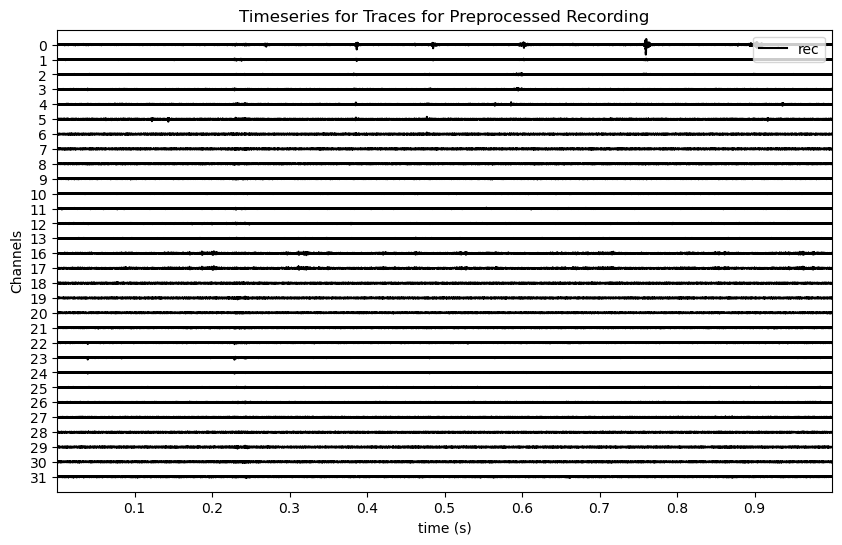

In [15]:
sw.plot_timeseries(recording_preprocessed, show_channel_ids=True)
plt.title("Timeseries for Traces for Preprocessed Recording")
plt.ylabel("Channels")

In [16]:
channel_ids = np.random.choice(recording_preprocessed.channel_ids, size=5, replace=False)

In [17]:
channel_ids = sorted(channel_ids, key=lambda x: float(x))

Text(0, 0.5, 'Channels')

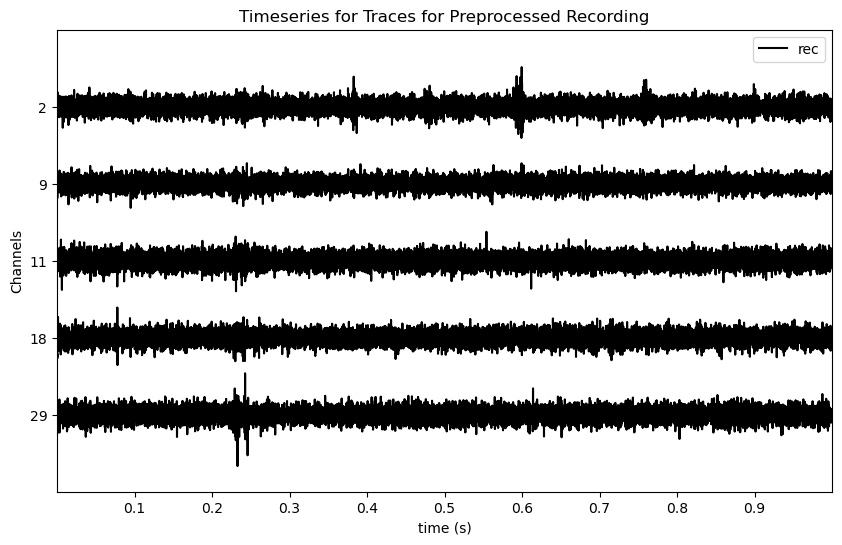

In [18]:

sw.plot_timeseries(recording_preprocessed, channel_ids=channel_ids, show_channel_ids=True)
plt.title("Timeseries for Traces for Preprocessed Recording")
plt.ylabel("Channels")

- Importing the Spike Sorting Output

In [19]:
all_spikesorting_directories = glob.glob("./proc/**/ss_output", recursive=True)

In [20]:
all_spikesorting_directories = sorted(all_spikesorting_directories)

In [21]:
all_spikesorting_directories

['./proc/20220907_140232test/mountainsort4/2022_09_27/ss_output']

- If you have more than one recording directory, then you must either:
    - A. Put the index of the file in `all_spikesorting_directories[0]` below. You would replace the `0` with the correct index. (Remember, Python is zero indexed so the first file in the list is 0. Second is 1, and so forth.
    - B. Add a absolute or relative path to `ss.read_sorter_folder({./path/to/spikesorting_directory}`) below. You would replace `{./path/to/spikesorting_directory}` with the path of the file for the spike sorting output directory.

In [22]:
spike_sorted_object = ss.read_sorter_folder(all_spikesorting_directories[0])

In [23]:
type(spike_sorted_object)

spikeinterface.core.npzsortingextractor.NpzSortingExtractor

- TODO's
    - Look into what the parameters do(like freq_min)
    - Compare it with the original recording 
    - Plotting PC space and ISI(interspike interval interval)
    - Average wave form of each 
    - Look over Maya's video and follow her visualization

# Part 1: Post Processing

- Different resources to look at for Post Processing
    - https://spikeinterface.readthedocs.io/en/latest/modules/toolkit/plot_2_postprocessing.html
    - https://github.com/SpikeInterface/spiketutorials/blob/master/Official_Tutorial_SI_0.90_Aug2021/SpikeInterface_Tutorial.ipynb
    - https://spikeinterface.readthedocs.io/en/latest/modules/toolkit/plot_3_quality_mertics.html
    - https://catalystneuro.github.io/spike-sorting-hackathon/

## Creating a folder for Spike Sorting Output

In [24]:
child_spikesorting_output_directory = Path(all_spikesorting_directories[0])
parent_spikesorting_output_directory = child_spikesorting_output_directory.parent.absolute()

In [25]:
parent_spikesorting_output_directory

PosixPath('/nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27')

- Creating a directory within the spike sorting directory for saving extracted waveforms 

In [26]:
waveform_output_directory = os.path.join(parent_spikesorting_output_directory, "waveforms")

In [27]:
waveform_output_directory

'/nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27/waveforms'

## Extracting Waveforms

In [28]:
from spikeinterface import WaveformExtractor, extract_waveforms
import spikeinterface.extractors as se

- The WaveformExtractor class:
    - randomly samples a subset spikes with max_spikes_per_unit
    - extracts all waveforms snippets for each unit
    - saves waveforms in a local folder
    - can load stored waveforms
    - retrieves template (average or median waveform) for each unit
    - https://spikeinterface.readthedocs.io/en/latest/modules/core/plot_4_waveform_extractor.html



- Extracting waveforms from preprocessed recordings and spike sorted output from spike_sorted 
    - Based on Maya's settings in recorded video 
    - Saving to folder

In [29]:
we_spike_sorted = si.extract_waveforms(recording=recording_preprocessed, 
                                       sorting=spike_sorted_object, folder=waveform_output_directory,
                                      ms_before=1, ms_after=1, progress_bar=True,
                                      n_jobs=8, total_memory="1G", overwrite=True,
                                       max_spikes_per_unit=2000)

extract waveforms memmap:   0%|          | 0/4 [00:00<?, ?it/s]

- Loading from folder

- Make into code cell if you want to look at details of waveform extraction

# Exporting for Manual Curation

Once we have the  `WaveformExtractor` object
we can post-process, validate, and curate the results. With
the :code:`toolkit.postprocessing` submodule, one can, for example,
get waveforms, templates, maximum channels, PCA scores, or export the data
to Phy. `Phy <https://github.com/cortex-lab/phy>`_ is a GUI for manual
curation of the spike sorting output. To export to phy you can run:



In [30]:
from spikeinterface.exporters import export_to_phy



In [31]:
phy_output_directory = os.path.join(parent_spikesorting_output_directory, "phy")

In [32]:
phy_output_directory

'/nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27/phy'

In [33]:
export_to_phy(we_spike_sorted, phy_output_directory,
              compute_pc_features=True, compute_amplitudes=True, remove_if_exists=True)

write_binary_recording with n_jobs = 1 and chunk_size = None
sample_inds: [      0       2       4 ... 6768526 6768555 6768565]
chan_inds: [14 27 16 ...  2 24 21]
traces.shape: (6768565, 30)
Run:
phy template-gui  /nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27/phy/params.py


## **Then you can run the template-gui with: `phy template-gui phy/params.py`
and manually curate the results.**



## Signal to Noise Ratio of Each Unit

- Calculating Signal to Noise Ratio

In [34]:
we_spike_sorted.get_template(unit_id=2).shape

(40, 30)

In [35]:
we_spike_sorted_signal_to_noise = spikeinterface.qualitymetrics.compute_snrs(we_spike_sorted).values()

In [36]:
we_spike_sorted_signal_to_noise

dict_values([3.8517513, 5.939439, 3.8158667, 0.5529467, 3.4371877, 0.3089416, 6.406632, 3.5588777, 0.43247157, 3.8264039, 0.3722846, 8.718441, 0.48442063, 4.3606076, 9.175381, 0.40731567, 3.580507, 0.4405397, 3.6454213, 0.41118294, 3.6186376, 3.6089323, 0.36564836, 0.3136512, 3.625396, 3.7803576, 0.42573792, 11.435034, 3.641325, 0.38129112, 0.4082349, 3.7845619, 8.806217, 2.5429773, 1.7829336, 6.1142473, 3.7804167, 0.45553643, 3.6026454, 0.44796997, 0.49860123, 3.835026, 9.741311, 0.42924744, 3.6186373, 10.343915, 0.4252658, 3.5725193, 6.547017, 12.143546, 3.8096478, 10.173928, 13.127432, 0.39705792, 0.29160124, 3.548828, 7.4445314, 8.664279, 3.6768305, 0.47028172, 0.36610338, 3.5778186, 9.649764, 0.38049653, 3.455369, 0.33285227, 3.7361672, 3.7446256, 0.48611125, 0.5402579, 3.7343364, 3.7820437, 0.4548])

In [37]:
len(we_spike_sorted_signal_to_noise)

73

- Filtering the Units that have higher signal to noise ratios
    - **NOTE**: If the histogram does not show enough information, either raise or lower the number of bins

(array([27.,  0.,  1.,  0.,  1., 12., 15.,  1.,  0.,  0.,  3.,  1.,  1.,
         0.,  0.,  4.,  2.,  1.,  1.,  1.,  0.,  1.,  1.]),
 array([ 0.29160124,  0.84968084,  1.40776038,  1.96583998,  2.52391958,
         3.0819993 ,  3.64007878,  4.19815826,  4.75623798,  5.3143177 ,
         5.87239695,  6.43047667,  6.98855639,  7.5466361 ,  8.10471535,
         8.66279507,  9.22087479,  9.77895451, 10.33703423, 10.89511395,
        11.45319271, 12.01127243, 12.56935215, 13.12743187]),
 <BarContainer object of 23 artists>)

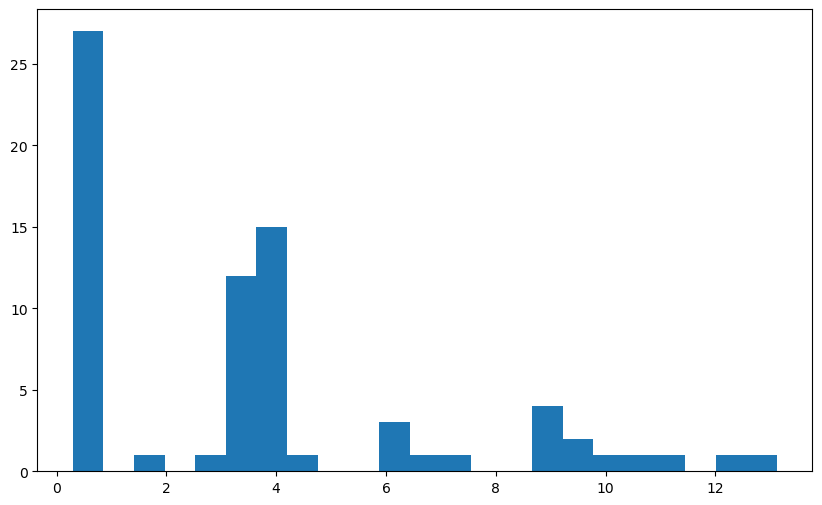

In [38]:
plt.hist(we_spike_sorted_signal_to_noise, bins=23)

- Creating a mask based on whether the SNR ratio is higher than what we specified
    - **NOTE**: Change the minimum signal to noise ratio based on the number of units that you want

In [39]:
mask = np.array(list(we_spike_sorted_signal_to_noise)) > 8

In [40]:
mask

array([False, False, False, False, False, False, False, False, False,
       False, False,  True, False, False,  True, False, False, False,
       False, False, False, False, False, False, False, False, False,
        True, False, False, False, False,  True, False, False, False,
       False, False, False, False, False, False,  True, False, False,
        True, False, False, False,  True, False,  True,  True, False,
       False, False, False,  True, False, False, False, False,  True,
       False, False, False, False, False, False, False, False, False,
       False])

In [41]:
spike_sorted_object.get_unit_ids()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12, 13, 14, 15, 16, 17,
       18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 34,
       35, 36, 37, 38, 39, 40, 41, 42, 43, 44, 45, 46, 47, 48, 49, 50, 51,
       52, 53, 54, 55, 56, 57, 58, 59, 60, 61, 62, 63, 64, 65, 66, 67, 68,
       69, 70, 71, 72, 73])

- We will get a list of all the Unit IDs that have higher SNR ratios based on the indexes of these units in the mask

In [42]:
high_snr_units = spike_sorted_object.get_unit_ids()[mask]

In [43]:
high_snr_units

array([12, 15, 28, 33, 43, 46, 50, 52, 53, 58, 63])

In [44]:
len(spike_sorted_object.get_unit_ids()[mask])

11

## Plotting the Waveforms for a single unit

- Each column represents a single channel
    - We are plotting the units with the highest signal to noise ratio
    - **NOTE**: Channels can be zero indexed, so the first channel will be numbered zero. Second will be one. And so on

In [45]:
we_spike_sorted

WaveformExtractor: 30 channels - 73 units - 1 segments
  before:20 after:20 n_per_units:2000

- TODO: Change X ticks so that they correspond to channel ID's

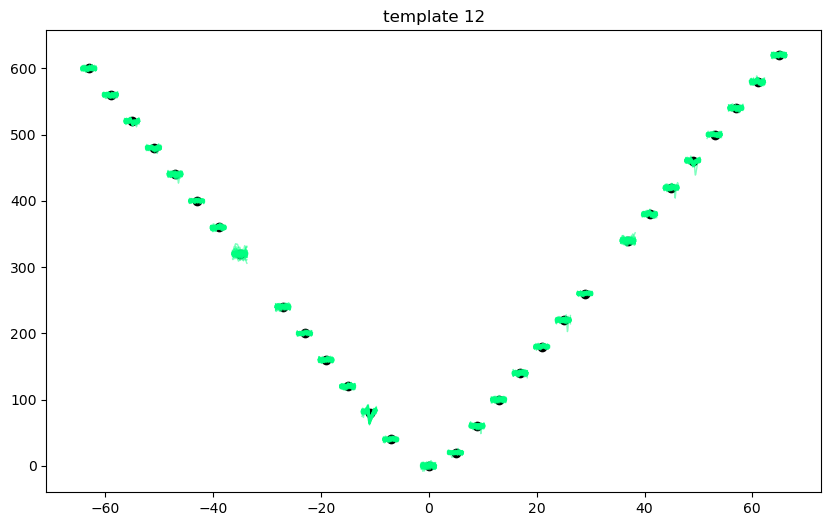

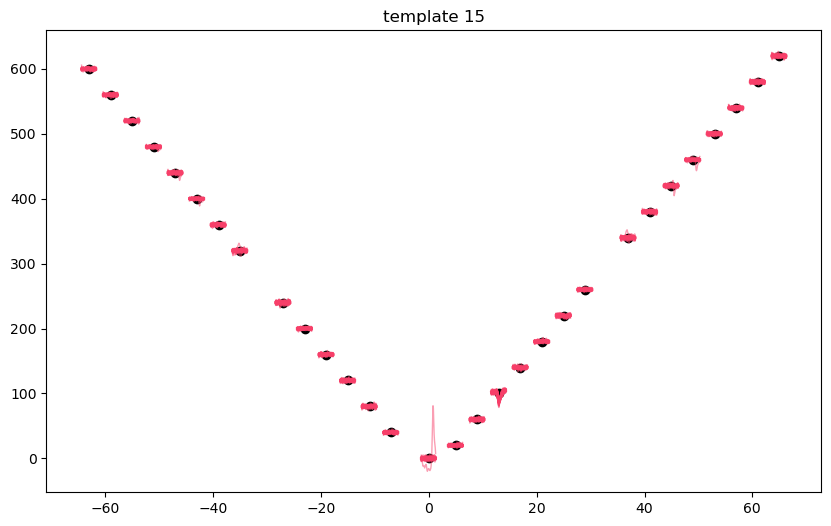

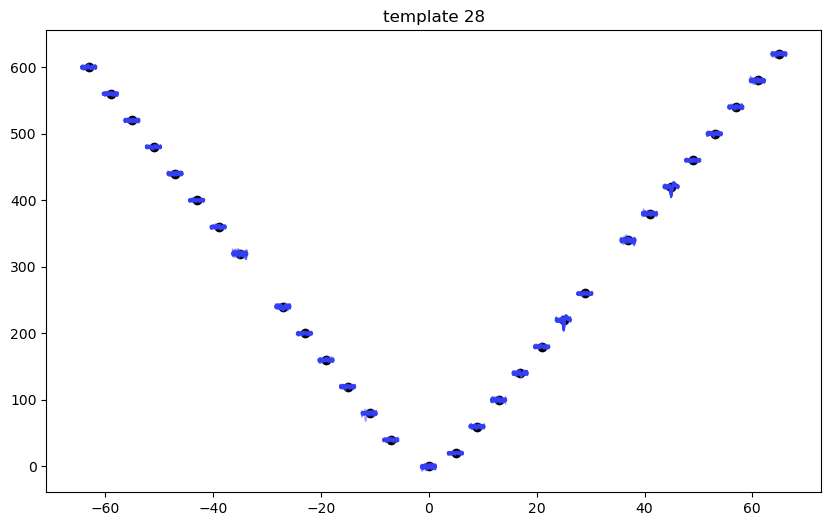

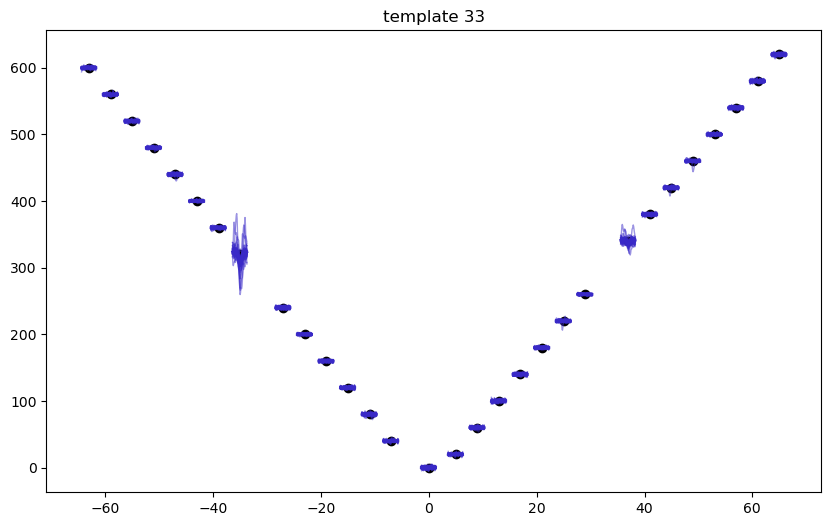

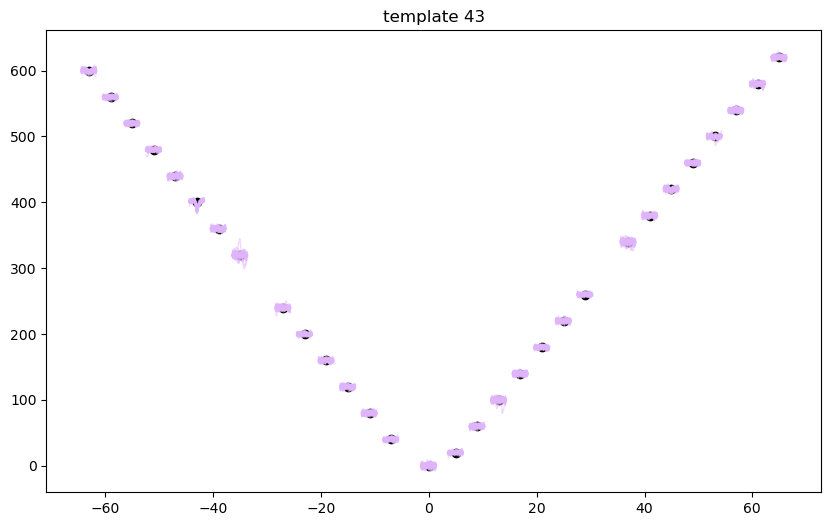

...

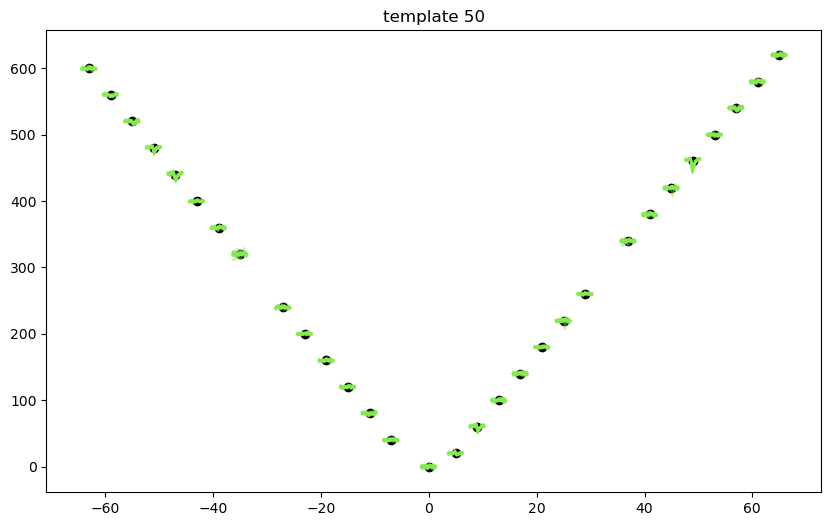

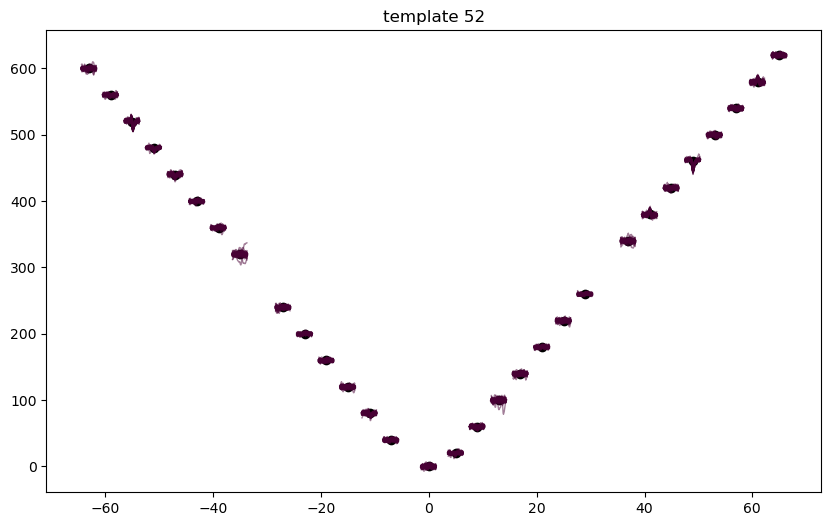

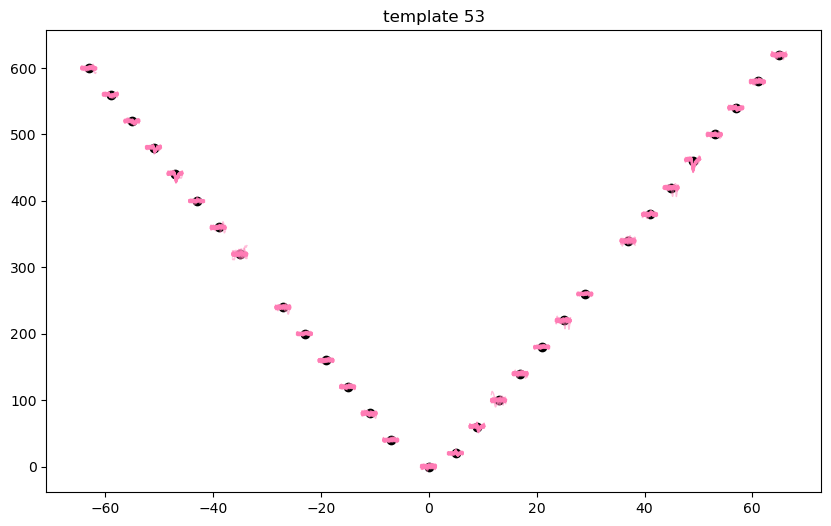

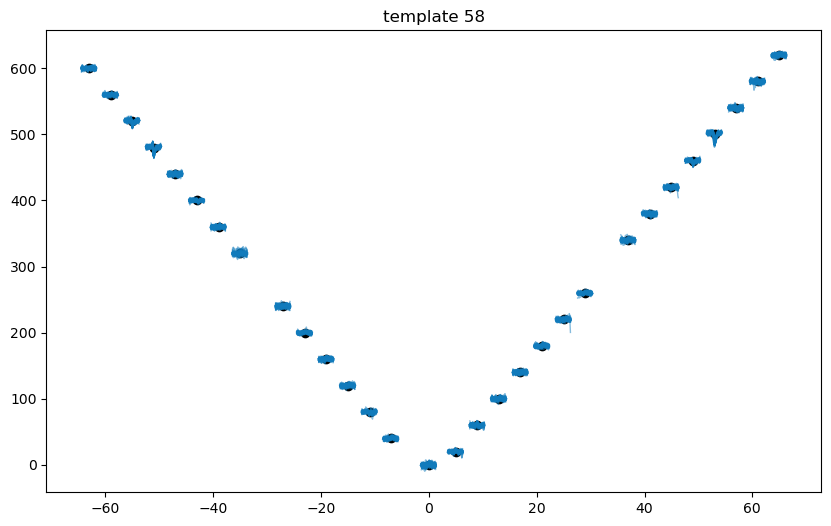

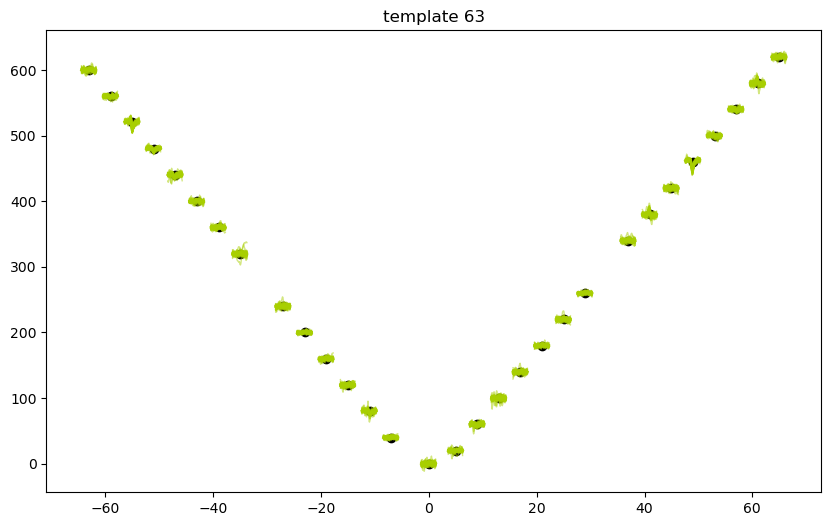

In [46]:
for unit_id in high_snr_units:
    w = sw.plot_unit_waveforms(we_spike_sorted, unit_ids=[unit_id], plot_templates=True, plot_channels=True)

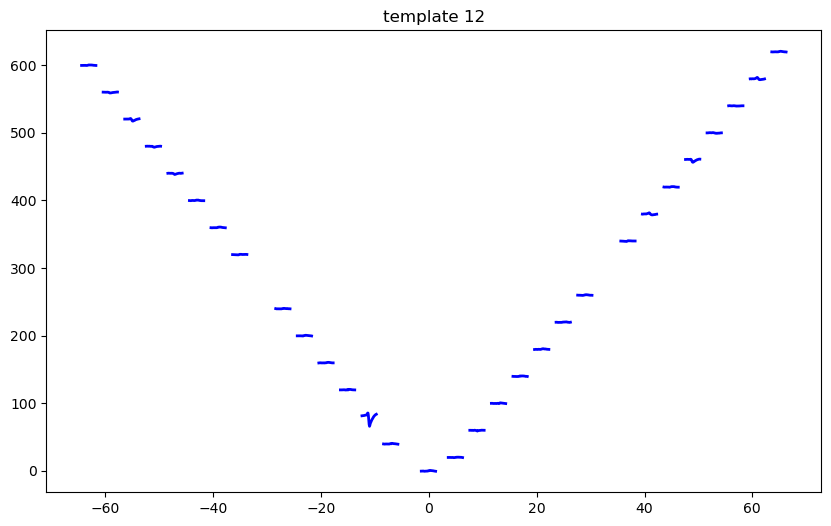

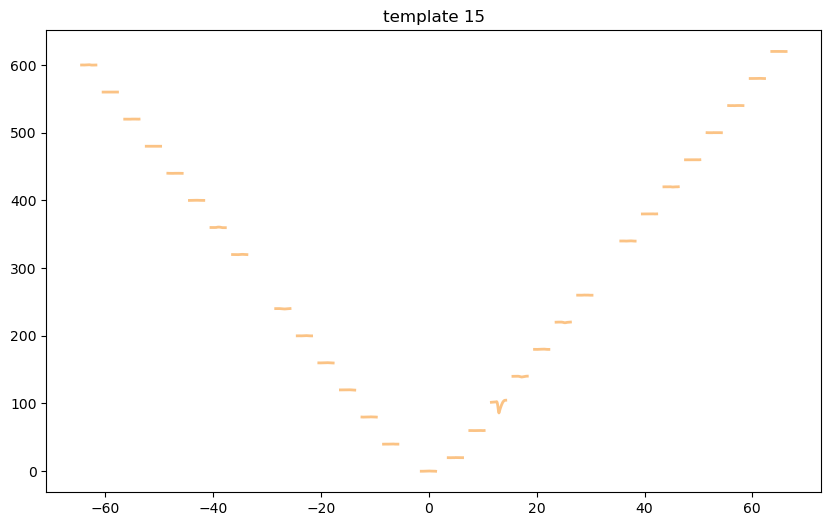

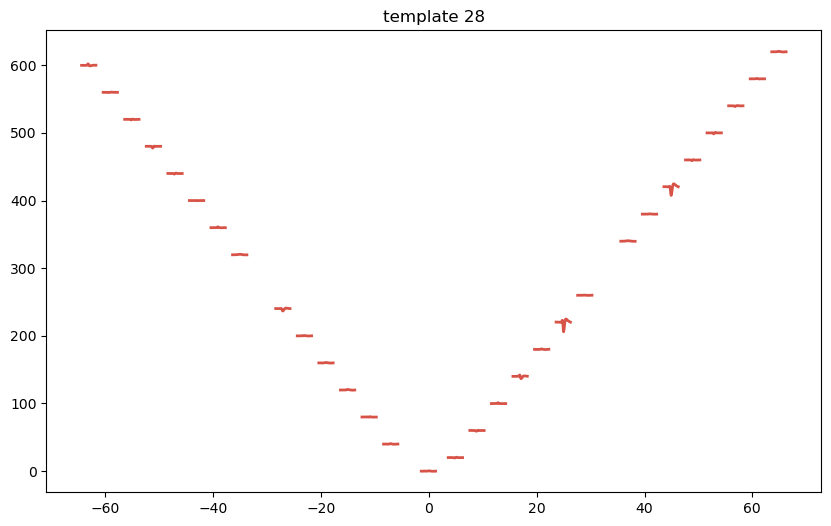

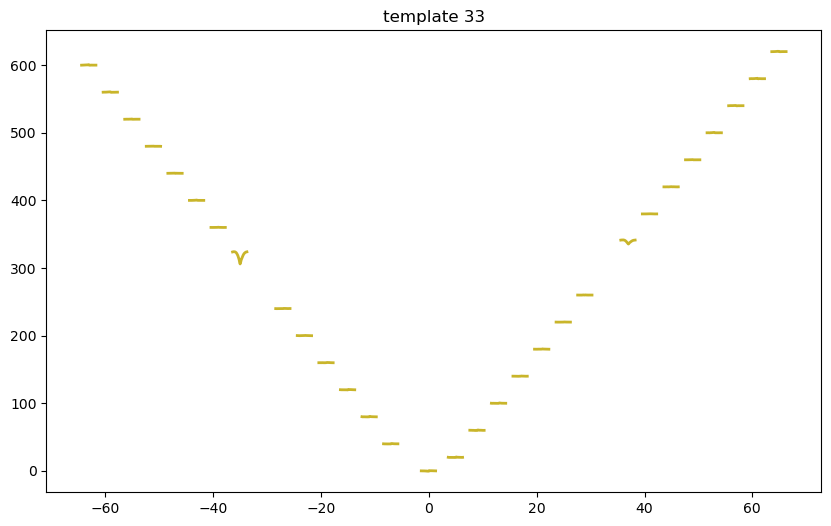

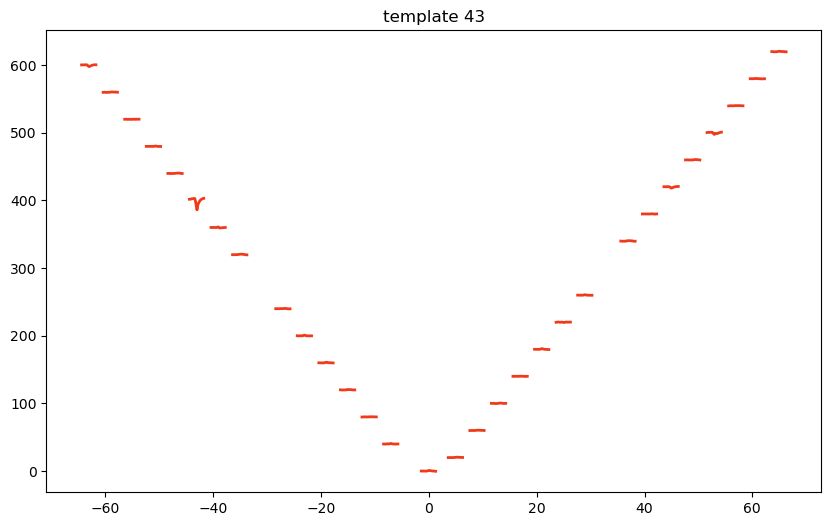

...

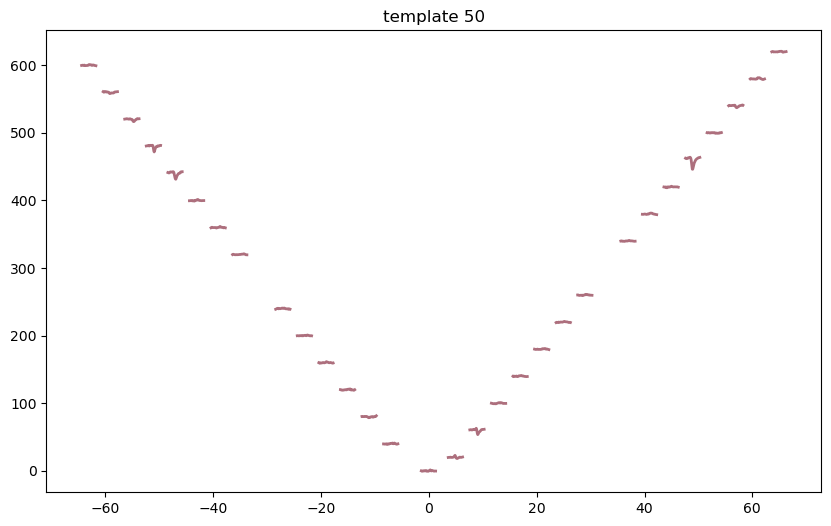

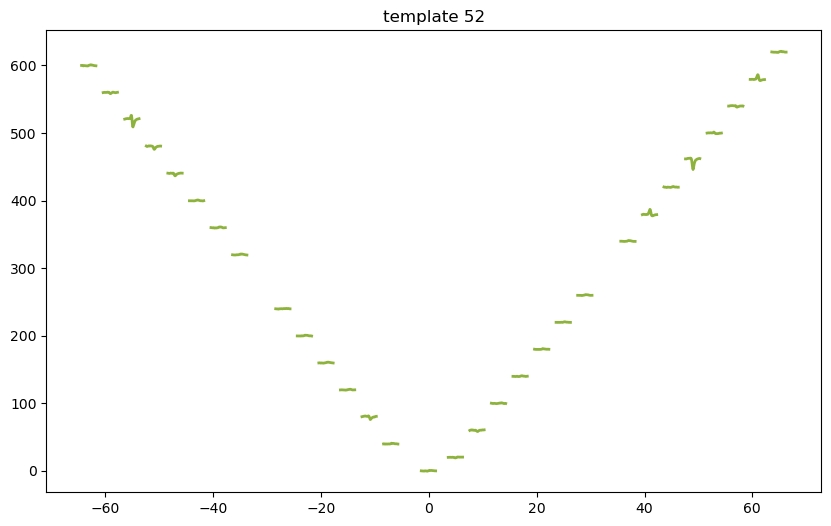

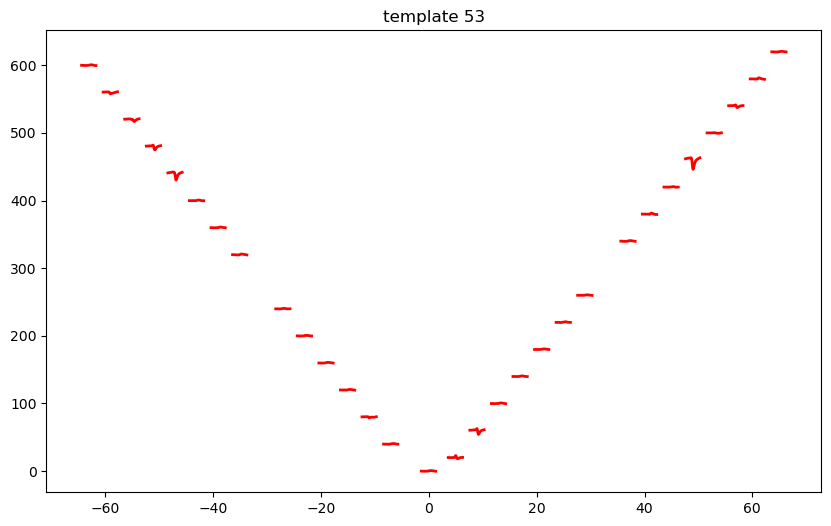

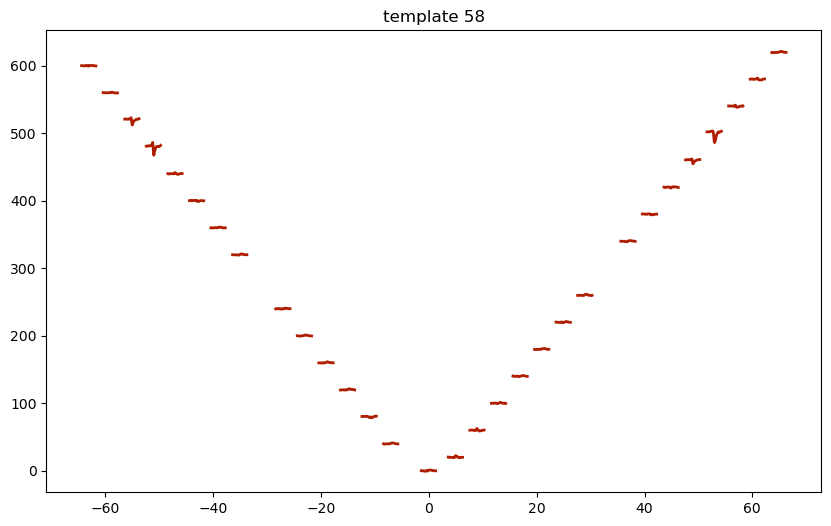

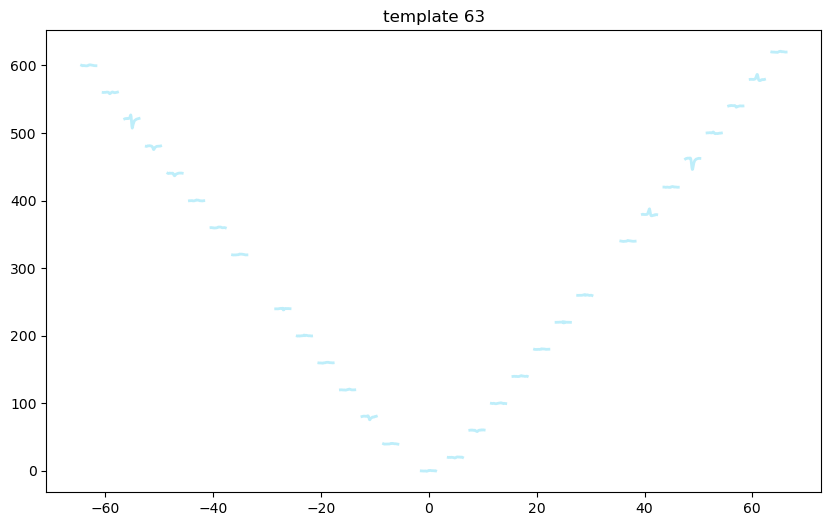

In [47]:
for unit_id in high_snr_units:
    w = sw.plot_unit_templates(we_spike_sorted, unit_ids=[unit_id])



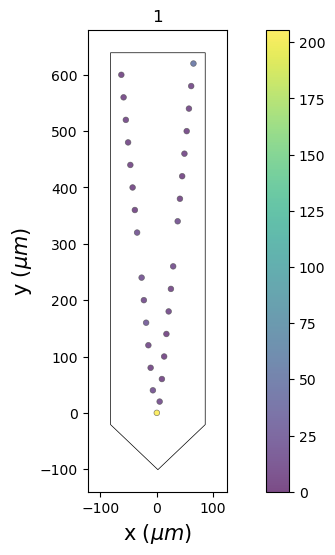

In [48]:
w = sw.plot_unit_probe_map(we_spike_sorted, unit_ids=[1])


## Plotting the Waveforms for a single channel

- Plotting the Average Waveforms (AKA Unit templates)

In [49]:
average_waveforms_output_directory = os.path.join(waveform_output_directory, "plots", "average_waveforms")

In [50]:
average_waveforms_output_directory

'/nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27/waveforms/plots/average_waveforms'

In [51]:
os.makedirs(average_waveforms_output_directory)

In [52]:
number_of_units_to_plot = len(high_snr_units)

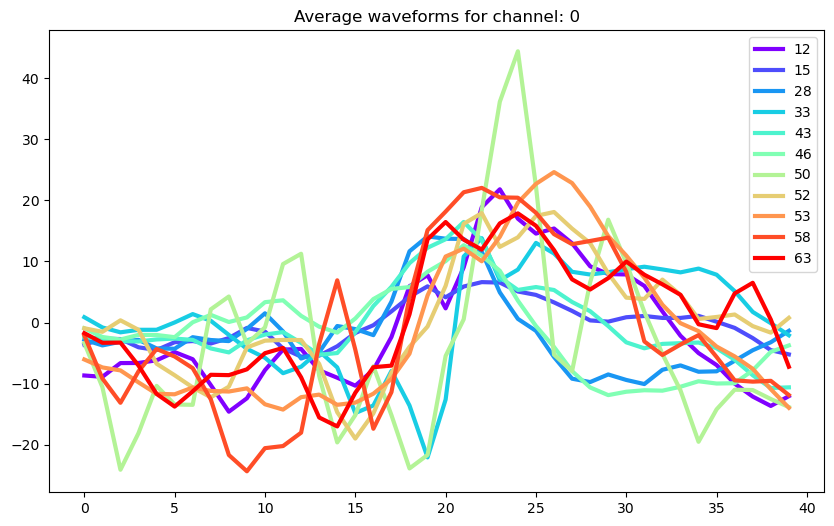

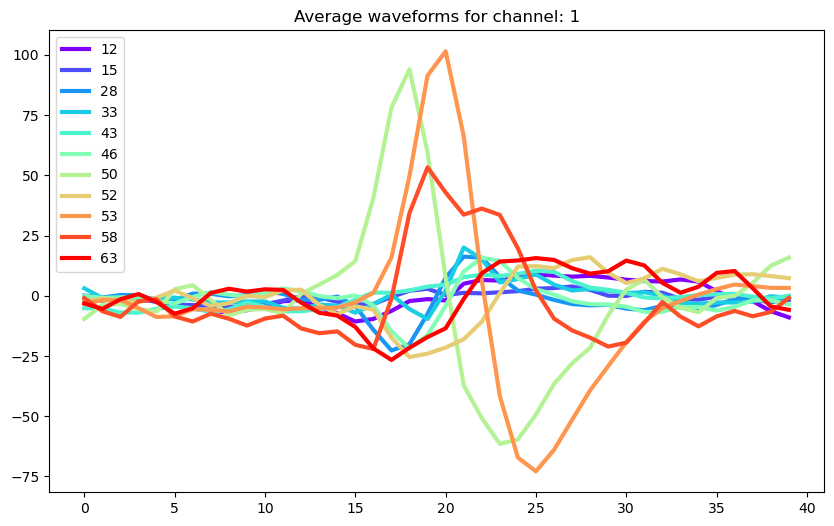

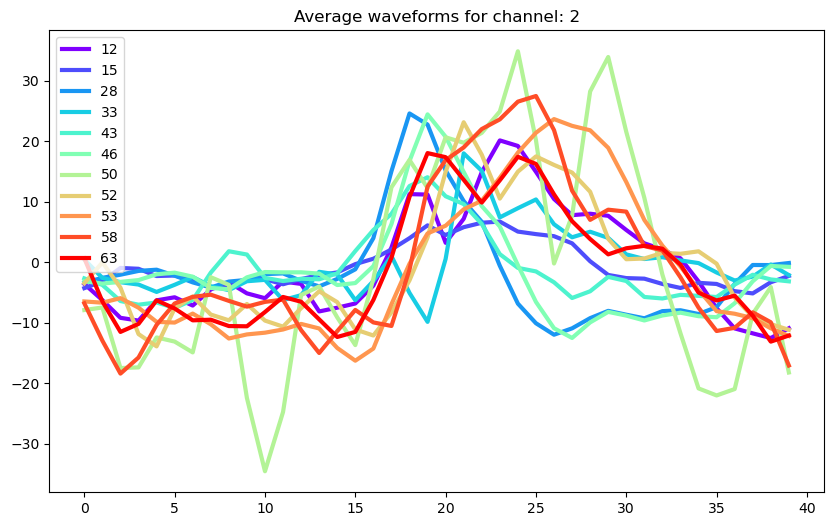

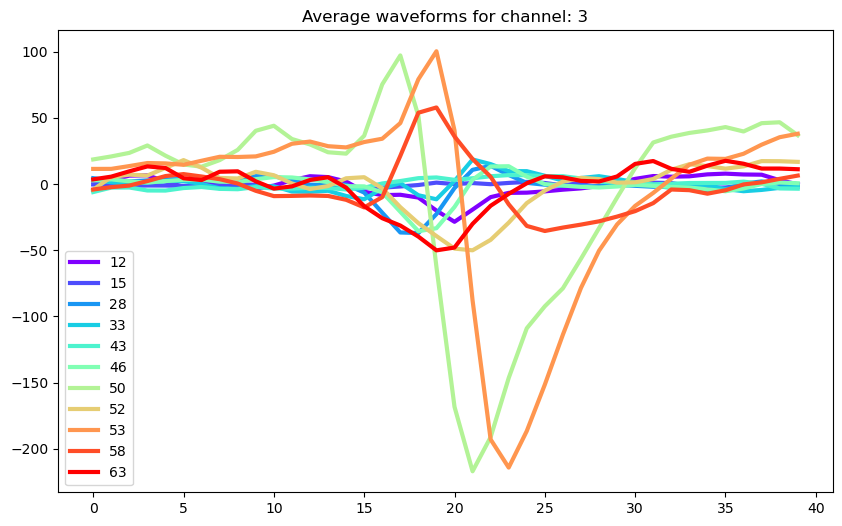

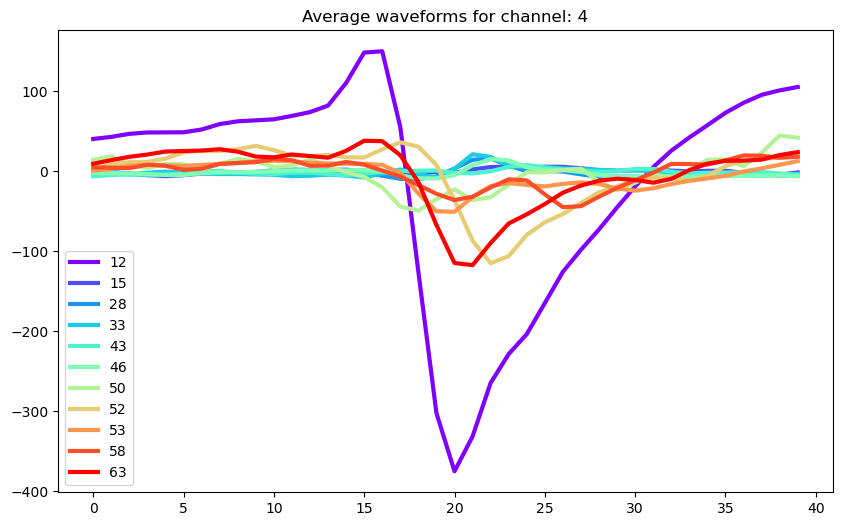

...

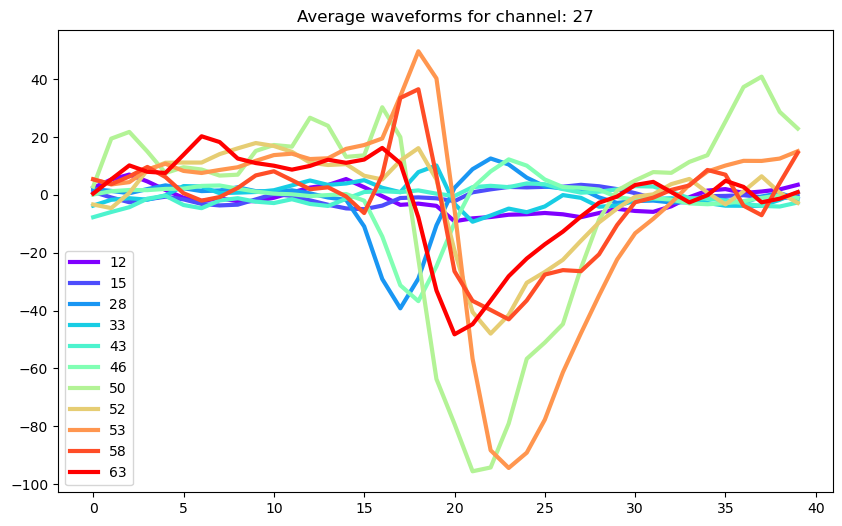

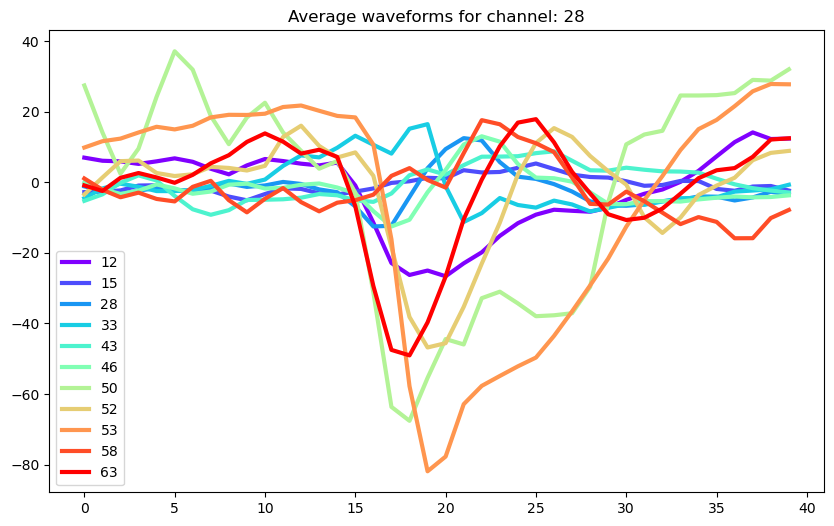

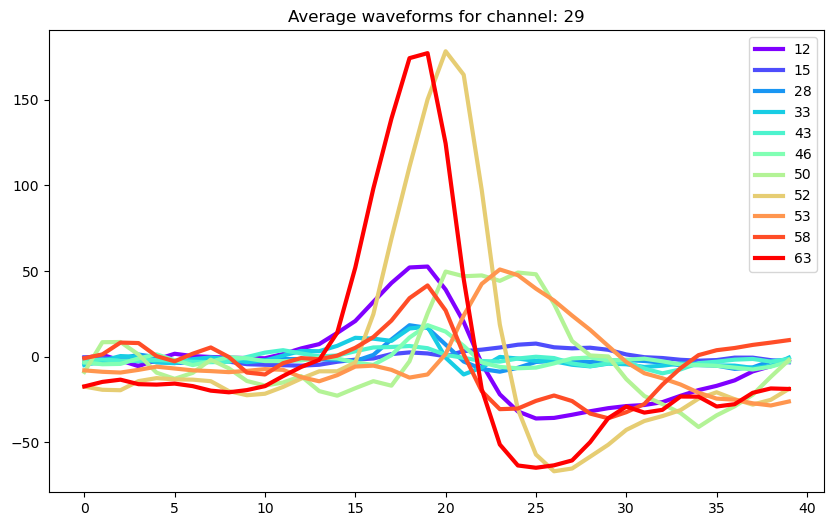

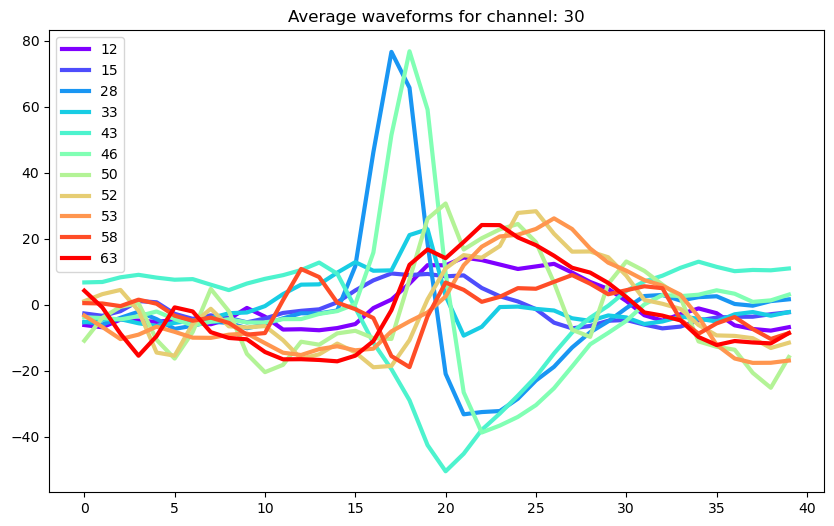

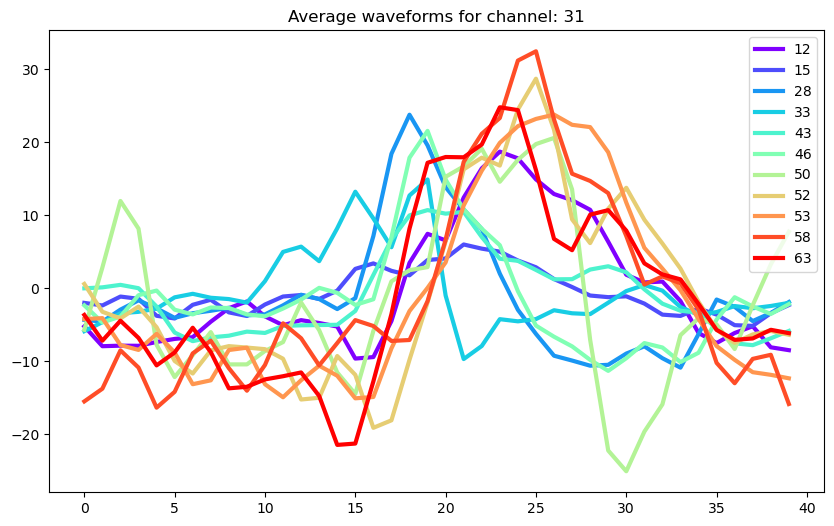

In [53]:
for index, channel in enumerate(recording_preprocessed.get_channel_ids()):
    colors = iter(cm.rainbow(np.linspace(0, 1, number_of_units_to_plot)))

    fig, ax = plt.subplots()
    for i, unit_id in enumerate(high_snr_units[:number_of_units_to_plot]):
        template = we_spike_sorted.get_template(unit_id)
        color = next(colors)
        ax.plot(template[:, index].T, color=color, lw=3, label=unit_id)
    ax.legend()
    ax.set_title("Average waveforms for channel: {}".format(channel))
    plt.savefig(os.path.join(average_waveforms_output_directory, "channel_{}_average_waveform".format(channel)))
    plt.show()
    plt.close()

In [54]:
recording_preprocessed.get_channel_ids()

array(['0', '1', '2', '3', '4', '5', '6', '7', '8', '9', '10', '11', '12',
       '13', '16', '17', '18', '19', '20', '21', '22', '23', '24', '25',
       '26', '27', '28', '29', '30', '31'], dtype='<U2')

- Plotting the Unit Summary for the high snr units

# TODO: 
    - Debug 
```IndexError: boolean index did not match indexed array along dimension 0; dimension is 1017581 but corresponding boolean dimension is 1017582 error```
- Find a way to add title

In [55]:
unit_summary_output_directory = os.path.join(waveform_output_directory, "plots", "unit_summary")

In [56]:
unit_summary_output_directory

'/nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27/waveforms/plots/unit_summary'

In [57]:
os.makedirs(unit_summary_output_directory, exist_ok=True)

mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,

mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,

mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,

/nancy/user/riwata/projects/spike_gadgets_repo/bin/conda_environment/fixed_spike_interface_env/lib/python3.9/site-packages/numpy/lib/histograms.py:906: RuntimeWarning: invalid value encountered in true_divide
  return n/db/n.sum(), bin_edges


mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,

mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,

mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,)
self.amplitudes[segment_index].shape: (301274,)
mask.shape: (301275,

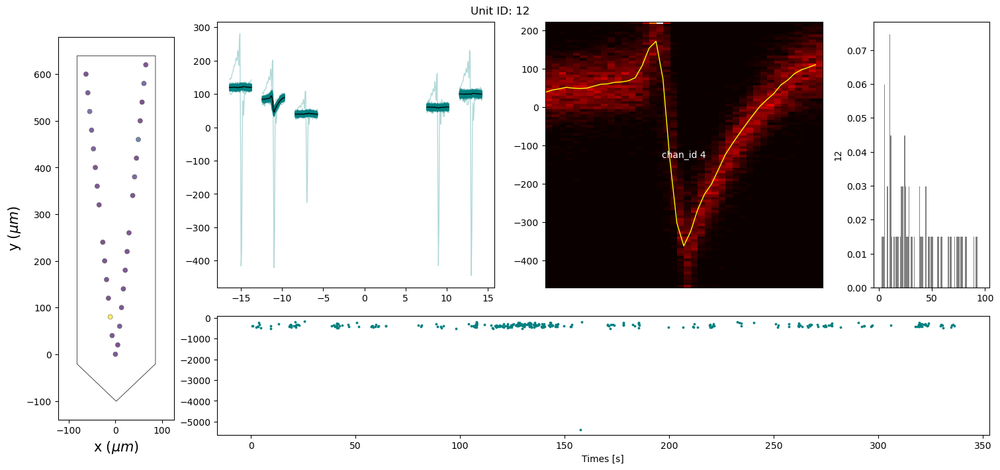

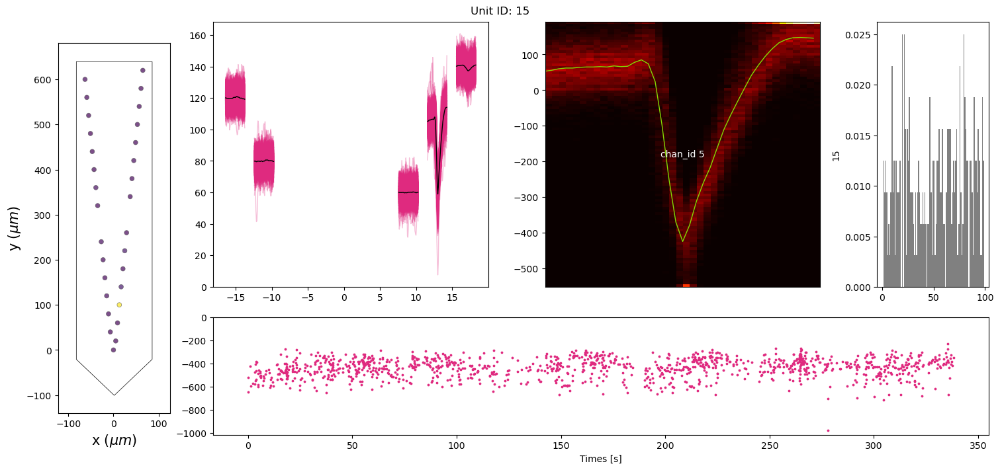

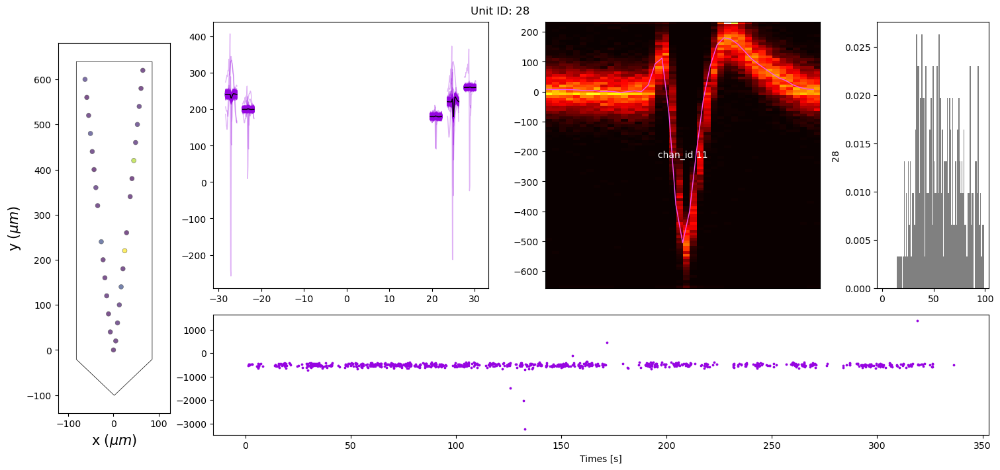

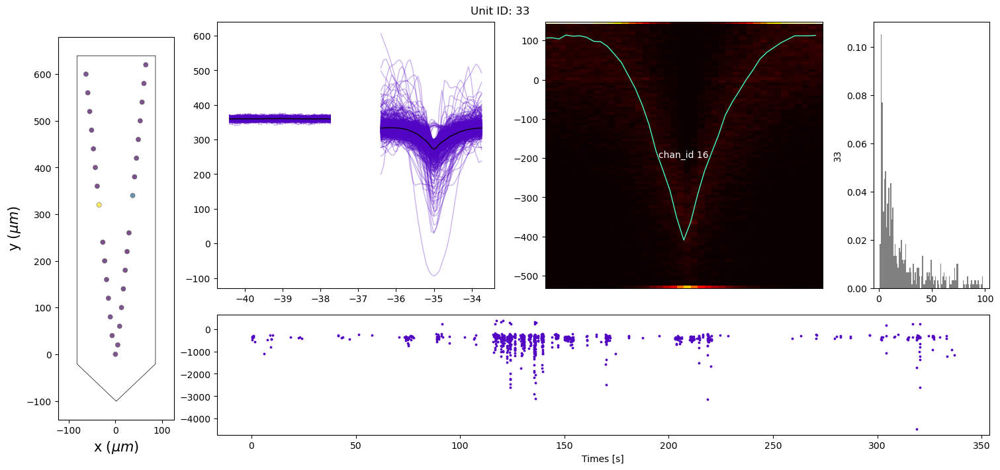

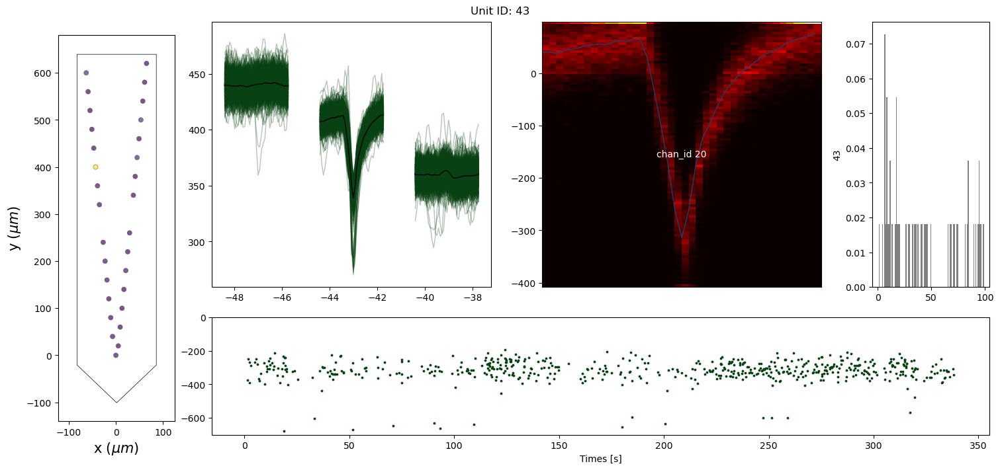

...

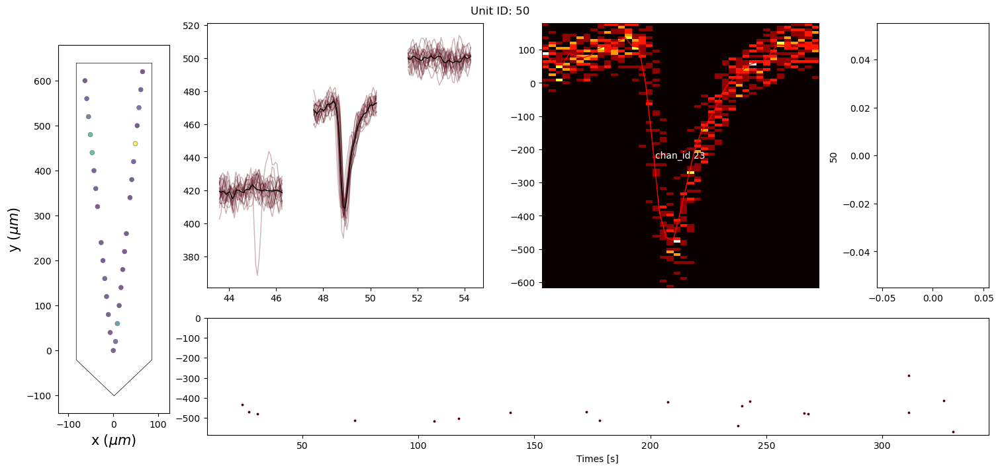

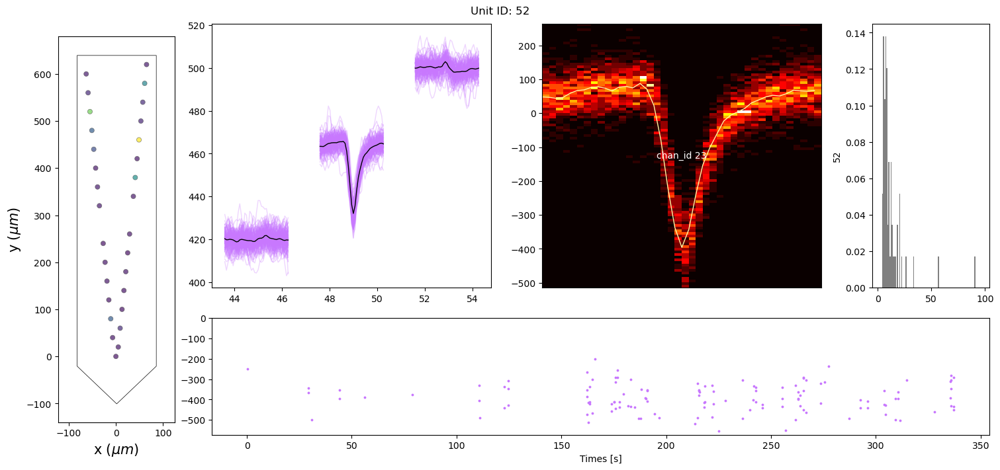

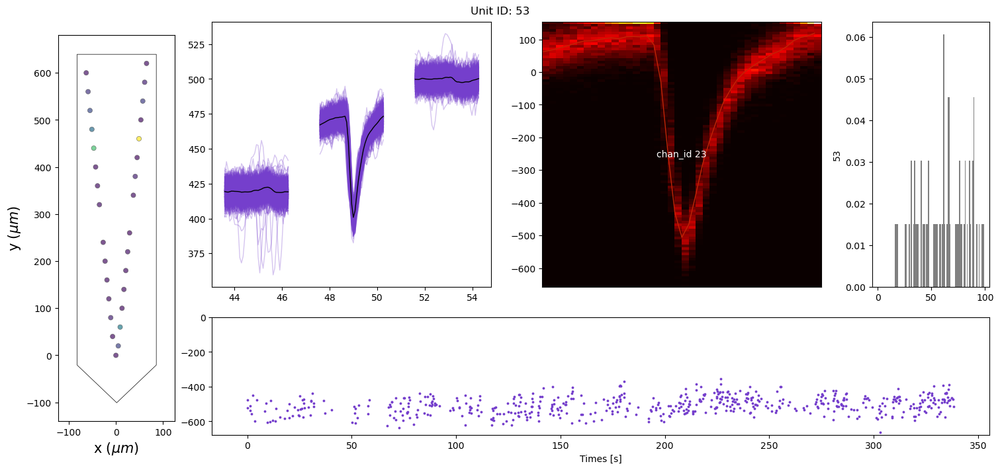

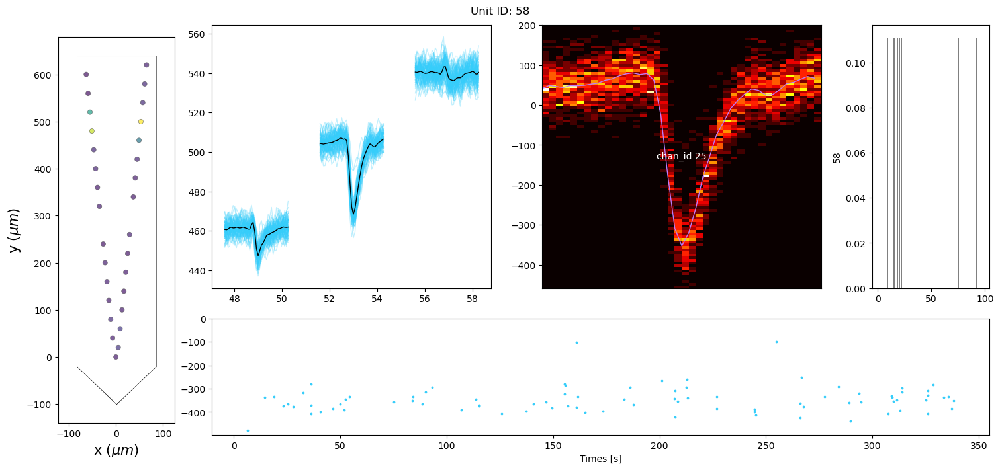

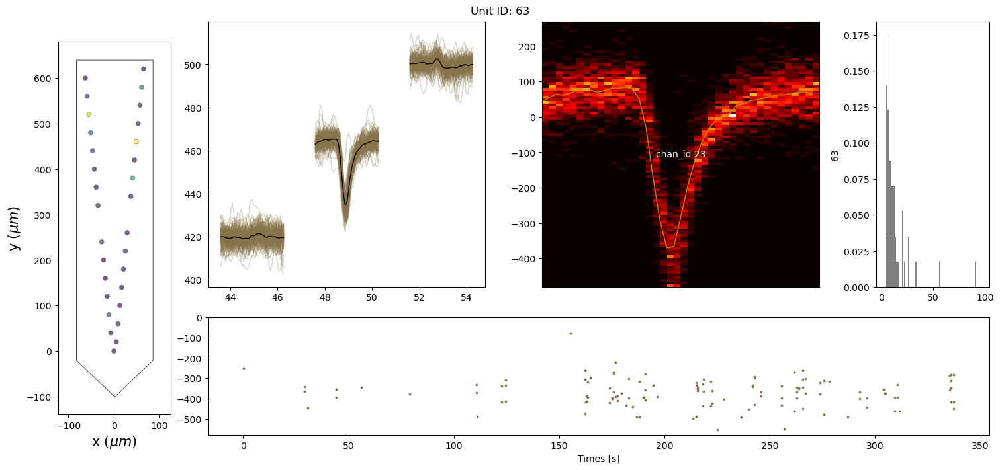

In [58]:
for index, unit_id in enumerate(high_snr_units):
    w = sw.plot_unit_summary(we_spike_sorted, unit_id=unit_id)
    plt.savefig(os.path.join(unit_summary_output_directory, "{}_unit_summary".format(unit_id)))    
    

- Waveform and Template Shapes
    - For waveforms, the dimension is (num_spikes, num_samples, num_channels), while each template has dimension (num_samples, num_channels). 

In [59]:
unit_id = high_snr_units[0]

waveforms = we_spike_sorted.get_waveforms(unit_id=unit_id)
print(f"Waveforms shape: {waveforms.shape}")
template = we_spike_sorted.get_template(unit_id=unit_id)
print(f"Template shape: {template.shape}")
all_templates = we_spike_sorted.get_all_templates()
print(f"All templates shape: {all_templates.shape}")



Waveforms shape: (307, 40, 30)
Template shape: (40, 30)
All templates shape: (73, 40, 30)


- The number of spikes for other waveforms
    - All are num waveforms are maxed out because we specied with the Waveform Extractor

In [60]:
unit_to_waveform_and_spike_number = defaultdict(dict)
for unit in spike_sorted_object.get_unit_ids():
    waveforms = we_spike_sorted.get_waveforms(unit_id=unit)
    spiketrain = spike_sorted_object.get_unit_spike_train(unit)
#     print(f"Unit {unit} - num waveforms: {waveforms.shape[0]} - num spikes: {len(spiketrain)}")
    unit_to_waveform_and_spike_number[unit]["number_of_waveforms"] = waveforms.shape[0]
    unit_to_waveform_and_spike_number[unit]["number_of_spikes"] = len(spiketrain)


In [61]:
unit_to_waveform_and_spike_number

defaultdict(dict,
            {1: {'number_of_waveforms': 627, 'number_of_spikes': 627},
             2: {'number_of_waveforms': 2000, 'number_of_spikes': 2340},
             3: {'number_of_waveforms': 2000, 'number_of_spikes': 4884},
             4: {'number_of_waveforms': 2000, 'number_of_spikes': 3725},
             5: {'number_of_waveforms': 2000, 'number_of_spikes': 4990},
             6: {'number_of_waveforms': 2000, 'number_of_spikes': 5203},
             7: {'number_of_waveforms': 826, 'number_of_spikes': 826},
             8: {'number_of_waveforms': 2000, 'number_of_spikes': 4815},
             9: {'number_of_waveforms': 2000, 'number_of_spikes': 4669},
             10: {'number_of_waveforms': 2000, 'number_of_spikes': 7382},
             11: {'number_of_waveforms': 2000, 'number_of_spikes': 4283},
             12: {'number_of_waveforms': 307, 'number_of_spikes': 307},
             13: {'number_of_waveforms': 2000, 'number_of_spikes': 2437},
             14: {'number_of_wavefo

# PCA Scores

PCA scores can be easily computed with the `compute_principal_components()` function. Similarly to the `extract_waveforms`, the function returns an object of type `WaveformPrincipalComponent` that allows to retrieve all pc scores on demand.

### Getting the Principal Components

- Calculating Principal Components
    - We will first be using the local channel option

In [62]:
pc = spikeinterface.postprocessing.compute_principal_components(we_spike_sorted, load_if_exists=True,
                                     n_components=3, mode='by_channel_local')


In [63]:
len(spike_sorted_object.get_unit_ids())

73

In [64]:
spike_sorted_object.get_unit_ids()[0]

1

- For pc scores of a single unit, the dimension is (num_spikes, num_components, num_channels). The get_all_components() function returns an array with the label/unit id for each component (all_labels) and an array of dimension (num_all_samples, num_components, num_channels).

In [65]:
pc1 = pc.get_projections(unit_id=1)

print(f"PC scores shape: {pc1.shape}")
all_labels, all_pcs = pc.get_all_projections()
print(f"All PC scores shape: {all_pcs.shape}")



PC scores shape: (627, 5, 30)
All PC scores shape: (121995, 5, 30)


- Plotting the PCA for units with high SNR for each channel
    - **NOTE**: If you see distinct clusters in the PCA plots. Then you will likely see a distinct spike for that unit in the same channel in the average waveforms plots. 

In [66]:
pca_output_directory = os.path.join(waveform_output_directory, "plots", "pca")


In [67]:
pca_output_directory


'/nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27/waveforms/plots/pca'

In [68]:
os.makedirs(pca_output_directory)

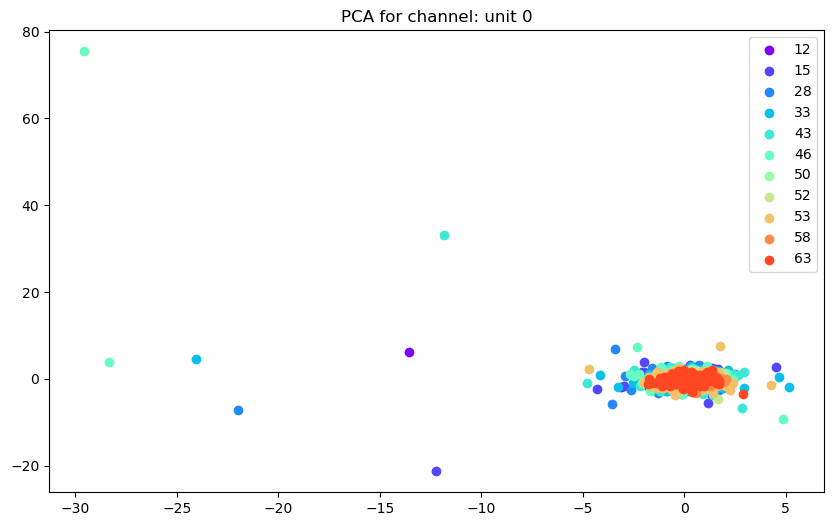

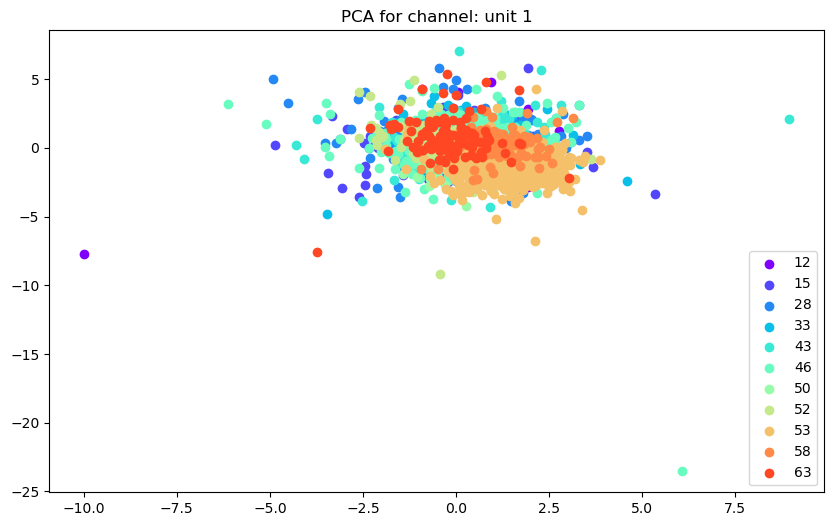

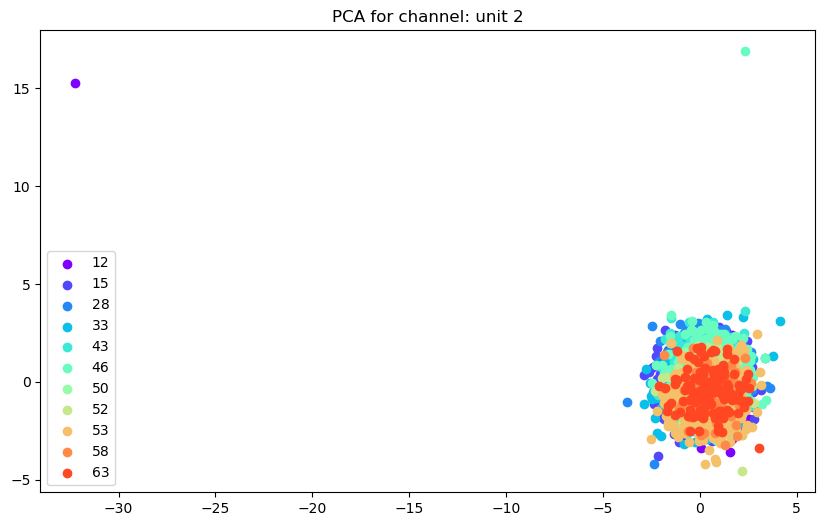

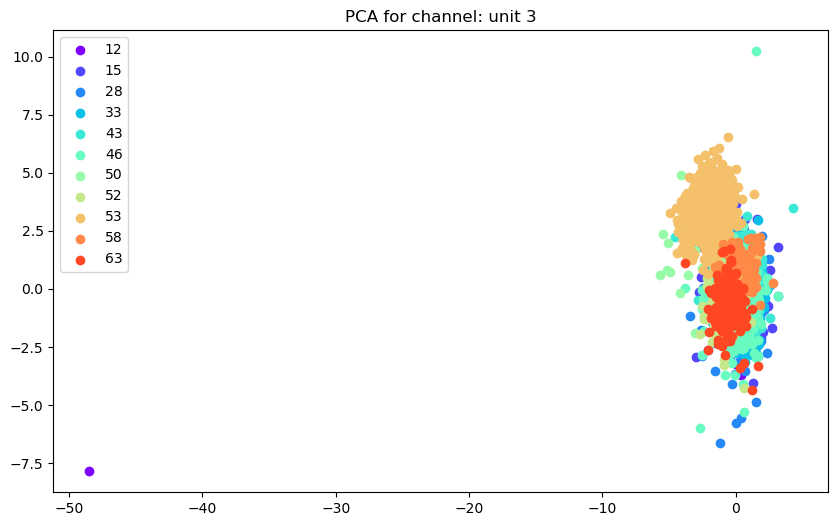

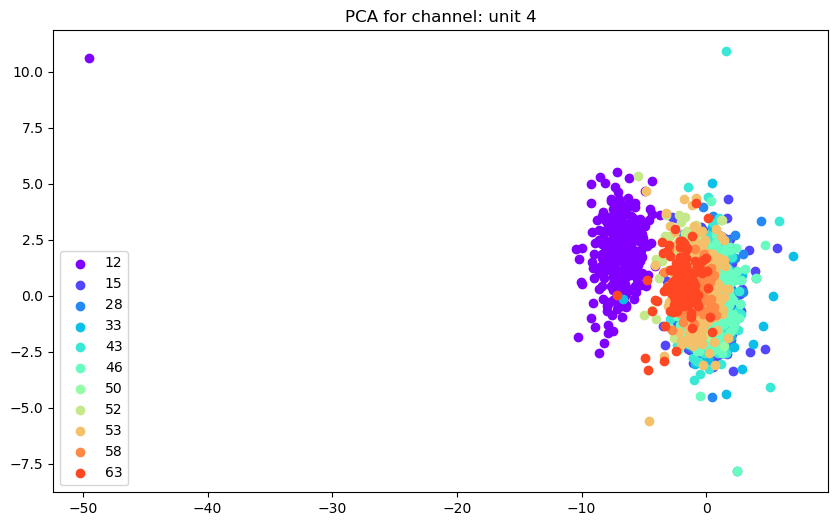

...

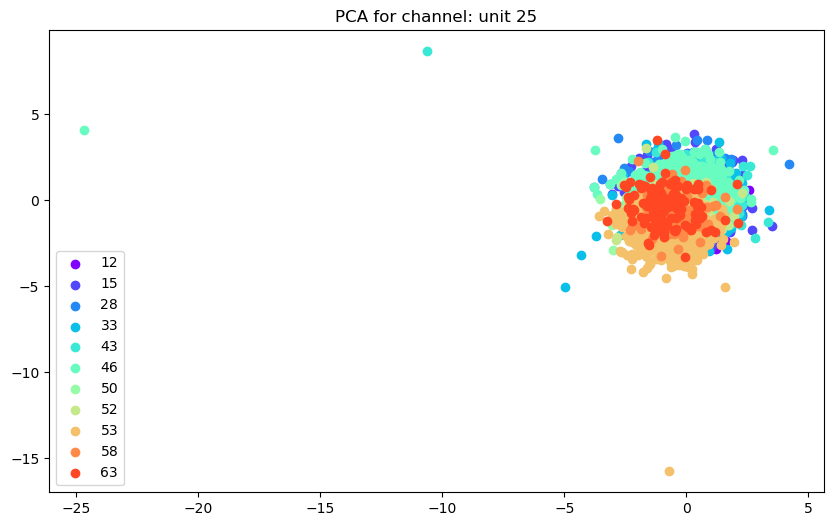

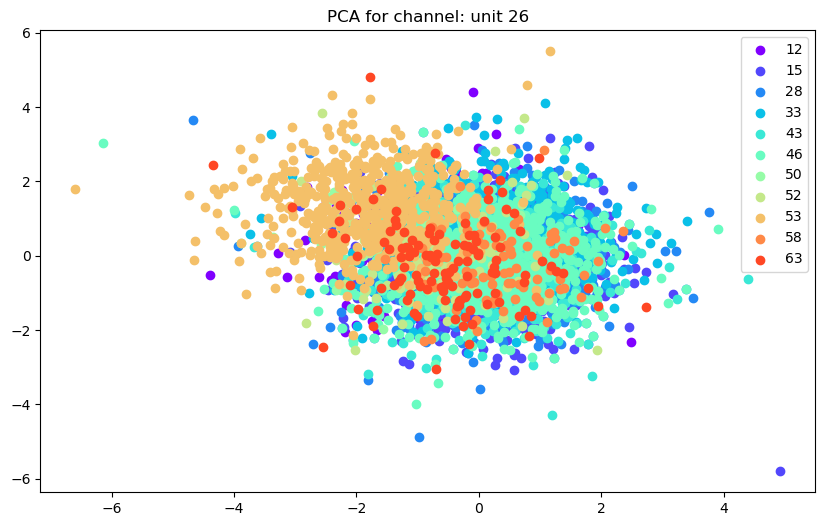

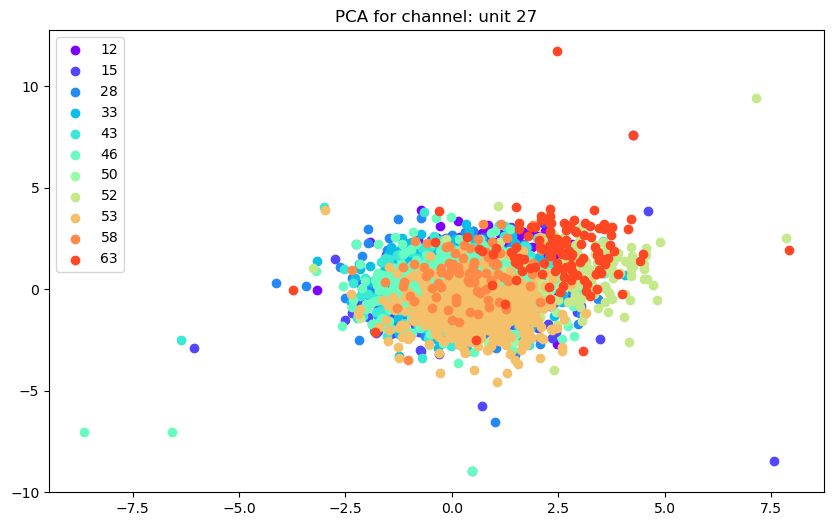

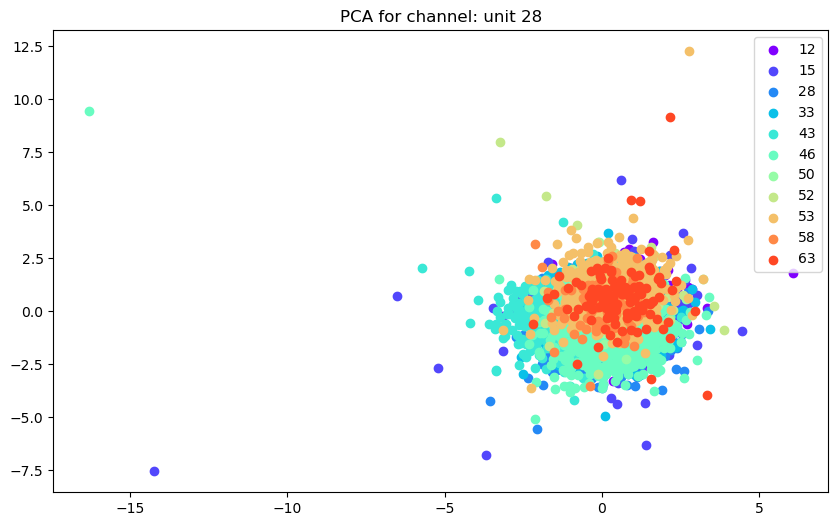

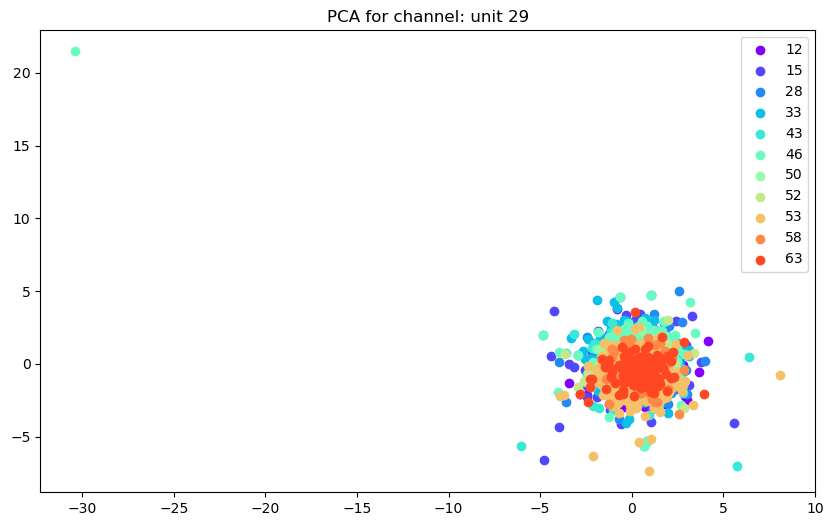

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error with plotting 12
error with plotting 15
error with plotting 28
error with plotting 33
error with plotting 43
error with plotting 46
error with plotting 50
error with plotting 52
error with plotting 53
error with plotting 58
error with plotting 63


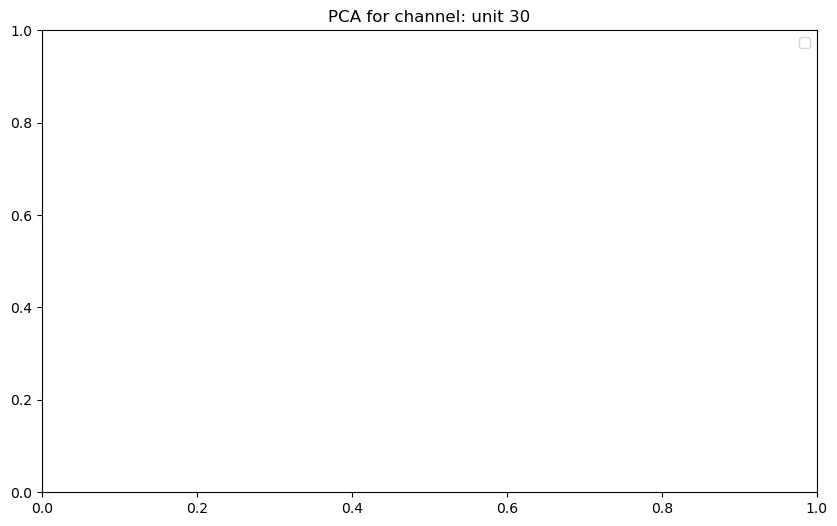

No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.


error with plotting 12
error with plotting 15
error with plotting 28
error with plotting 33
error with plotting 43
error with plotting 46
error with plotting 50
error with plotting 52
error with plotting 53
error with plotting 58
error with plotting 63


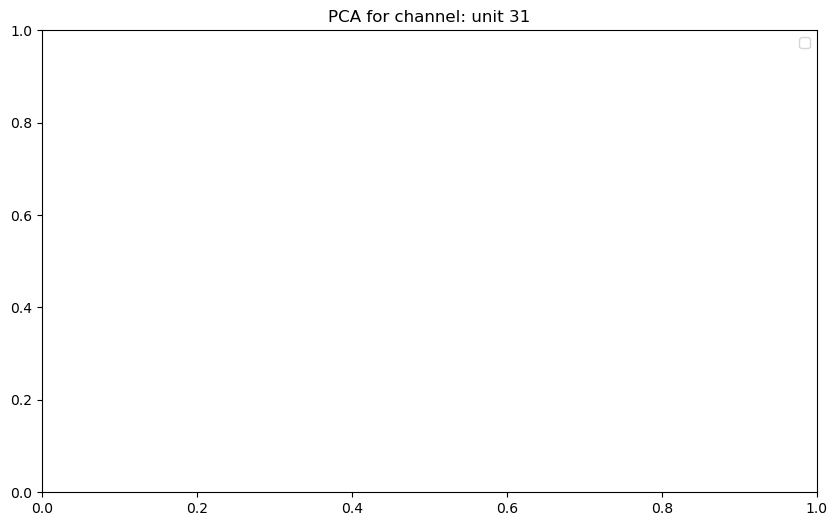

In [69]:
for channel_id in recording_preprocessed.get_channel_ids():
    try:
        fig, ax = plt.subplots()
        n = len(high_snr_units) + 1
        colors = iter(cm.rainbow(np.linspace(0, 1, n)))
        for i, unit_id in enumerate(high_snr_units):
            try:
                comp = pc.get_projections(unit_id)
                color = next(colors)
                ax.scatter(comp[:, 0, int(channel_id)], comp[:, 1, int(channel_id)], color=color, label=unit_id)
            except:
                print("error with plotting {}".format(unit_id))
        ax.set_title("PCA for channel: unit {}".format(channel_id))
        plt.legend()
        plt.savefig(os.path.join(pca_output_directory, "pca_channel_{}".format(channel_id)))
        plt.show()
        plt.close()
    except:
        print("error with plotting: channel {}".format(channel_id))

# Compute template metrics

- Template metrics, or extracellular features, such as peak to valley duration or full-width half maximum, are important to classify neurons into putative classes (excitatory - inhibitory). The `toolkit` allows one to compute several of these metrics:

In [70]:
try:
    template_metrics = spikeinterface.postprocessing.compute_template_metrics(we_spike_sorted)
except BaseException as e:
    logger.error('Failed to do something: ' + str(e))

/nancy/user/riwata/projects/spike_gadgets_repo/bin/conda_environment/fixed_spike_interface_env/lib/python3.9/site-packages/scipy/stats/_stats_mstats_common.py:181: RuntimeWarning: invalid value encountered in double_scalars
  slope = ssxym / ssxm
/nancy/user/riwata/projects/spike_gadgets_repo/bin/conda_environment/fixed_spike_interface_env/lib/python3.9/site-packages/scipy/stats/_stats_mstats_common.py:195: RuntimeWarning: invalid value encountered in sqrt
  t = r * np.sqrt(df / ((1.0 - r + TINY)*(1.0 + r + TINY)))
/nancy/user/riwata/projects/spike_gadgets_repo/bin/conda_environment/fixed_spike_interface_env/lib/python3.9/site-packages/scipy/stats/_stats_mstats_common.py:198: RuntimeWarning: invalid value encountered in double_scalars
  slope_stderr = np.sqrt((1 - r**2) * ssym / ssxm / df)


In [71]:

try:
    print(template_metrics)
except BaseException as e:
    logger.error('Failed to do something: ' + str(e))

   peak_to_valley peak_trough_ratio half_width repolarization_slope  \
1         0.00093          -0.23392     0.0002        478317.299107   
2         0.00047         -0.371595   0.000225        750819.362682   
3         0.00048         -0.119179    0.00013        480258.160146   
4         0.00031          -0.22052   0.000115        419927.572514   
5        0.000485          -0.09924    0.00012       1464763.399629   
..            ...               ...        ...                  ...   
69       0.000685          0.028625    0.00185                  NaN   
70       0.000695         -0.146326   0.000255         57314.541083   
71        0.00064         -0.102112    0.00013        567420.813269   
72        0.00093         -0.135146    0.00014        516407.986385   
73       0.000785         -0.077391   0.000115         40495.909955   

   recovery_slope  
1  -746152.928531  
2  -135220.916467  
3   -13694.073137  
4    -3385.731097  
5   -13339.448313  
..            ...  
69     

# Validation and Curation with Quality Metrics

Quality metrics for the spike sorting output are very important to asses the spike sorting performance.
The :code:`spikeinterface.toolkit.qualitymetrics` module implements several quality metrics
to assess the goodness of sorted units. Among those, for example,
are signal-to-noise ratio, ISI violation ratio, isolation distance, and many more.
Theses metrics are built on top of WaveformExtractor class and return a dictionary with the unit ids as keys:



In [72]:
isi_violation_tuple = spikeinterface.qualitymetrics.compute_isi_violations(we_spike_sorted, isi_threshold_ms=2.5)

In [73]:
isi_violation_tuple

isi_violation(isi_violations_ratio={1: 6.02600787527758, 2: 0.19778119658119656, 3: 0.29794405263539175, 4: 0.33170581937750554, 5: 0.24464601748587358, 6: 0.23752683709102168, 7: 0.29761710803252645, 8: 0.2452355547791656, 9: 0.25770751117419294, 10: 0.2720149448221053, 11: 0.2582846659760537, 12: 0.0, 13: 0.35330303458394885, 14: 0.2808283267575323, 15: 0.22775049277874723, 16: 0.23512208955273367, 17: 0.23063078144117077, 18: 0.27772456153880387, 19: 0.2987107702808858, 20: 0.24845655535777858, 21: 0.3288569679478771, 22: 0.24257156624107504, 23: 0.2522497303705417, 24: 0.20727554952311852, 25: 0.24702613169223767, 26: 0.2509701832034412, 27: 0.27184162761885206, 28: 0.0, 29: 0.24175132400067467, 30: 0.23758784675690106, 31: 0.24921155533228703, 32: 0.2822876690776985, 33: 3.3032525830081125, 34: 4.894500433873264, 35: 1.0682443309512388, 36: 1.4147047514210371, 37: 0.24996645164735126, 38: 0.3268751155065985, 39: 0.2839366708114067, 40: 0.30194463840629393, 41: 0.28799999900533346,

isi_violations_ratio: 
{1: 6.02600787527758, 2: 0.19778119658119656, 3: 0.29794405263539175, 4: 0.33170581937750554, 5: 0.24464601748587358, 6: 0.23752683709102168, 7: 0.29761710803252645, 8: 0.2452355547791656, 9: 0.25770751117419294, 10: 0.2720149448221053, 11: 0.2582846659760537, 12: 0.0, 13: 0.35330303458394885, 14: 0.2808283267575323, 15: 0.22775049277874723, 16: 0.23512208955273367, 17: 0.23063078144117077, 18: 0.27772456153880387, 19: 0.2987107702808858, 20: 0.24845655535777858, 21: 0.3288569679478771, 22: 0.24257156624107504, 23: 0.2522497303705417, 24: 0.20727554952311852, 25: 0.24702613169223767, 26: 0.2509701832034412, 27: 0.27184162761885206, 28: 0.0, 29: 0.24175132400067467, 30: 0.23758784675690106, 31: 0.24921155533228703, 32: 0.2822876690776985, 33: 3.3032525830081125, 34: 4.894500433873264, 35: 1.0682443309512388, 36: 1.4147047514210371, 37: 0.24996645164735126, 38: 0.3268751155065985, 39: 0.2839366708114067, 40: 0.30194463840629393, 41: 0.28799999900533346, 42: 0.26260

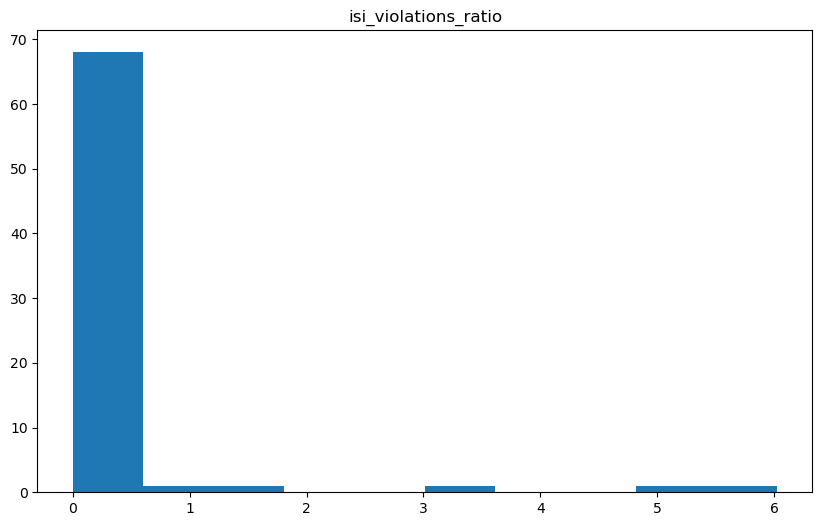

isi_violations_rate: 
{1: 0.10341923186990687, 2: 0.047277363140528855, 3: 0.3102576956097206, 4: 0.20092879334724764, 5: 0.2659351676654748, 6: 0.2807093436468901, 7: 0.00886450558884916, 8: 0.2482061564877765, 9: 0.24525132129149343, 10: 0.6471089079859887, 11: 0.20683846373981374, 12: 0.0, 13: 0.09159989108477466, 14: 0.3811737403205139, 15: 0.014774175981415267, 16: 0.13001274863645434, 17: 0.165470770991851, 18: 0.11523857265503909, 19: 0.15956110059928488, 20: 0.1713804413844171, 21: 0.2482061564877765, 22: 0.2097932989360968, 23: 0.1713804413844171, 24: 0.2629803324691918, 25: 0.32207703639485286, 26: 0.4314059386573258, 27: 0.24525132129149343, 28: 0.0, 29: 0.4520897850313072, 30: 0.2600254972729087, 31: 0.1211482430476052, 32: 0.1388772542253035, 33: 0.09159989108477466, 34: 0.1536514302067188, 35: 0.11819340785132214, 36: 0.19501912295468155, 37: 0.5289155001346666, 38: 0.31912220119856977, 39: 0.777121656622443, 40: 0.49936714817183603, 41: 0.22752231011379512, 42: 0.4609542

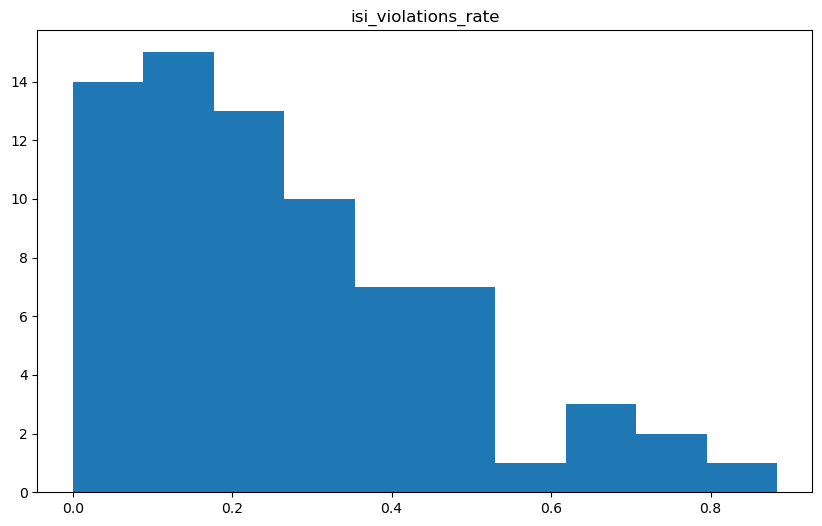

isi_violations_count: 
{1: 35, 2: 16, 3: 105, 4: 68, 5: 90, 6: 95, 7: 3, 8: 84, 9: 83, 10: 219, 11: 70, 12: 0, 13: 31, 14: 129, 15: 5, 16: 44, 17: 56, 18: 39, 19: 54, 20: 58, 21: 84, 22: 71, 23: 58, 24: 89, 25: 109, 26: 146, 27: 83, 28: 0, 29: 153, 30: 88, 31: 41, 32: 47, 33: 31, 34: 52, 35: 40, 36: 66, 37: 179, 38: 108, 39: 263, 40: 169, 41: 77, 42: 156, 43: 1, 44: 54, 45: 108, 46: 1, 47: 89, 48: 107, 49: 0, 50: 0, 51: 72, 52: 0, 53: 0, 54: 39, 55: 105, 56: 119, 57: 0, 58: 0, 59: 221, 60: 147, 61: 117, 62: 158, 63: 0, 64: 132, 65: 130, 66: 166, 67: 299, 68: 198, 69: 146, 70: 165, 71: 267, 72: 228, 73: 139}


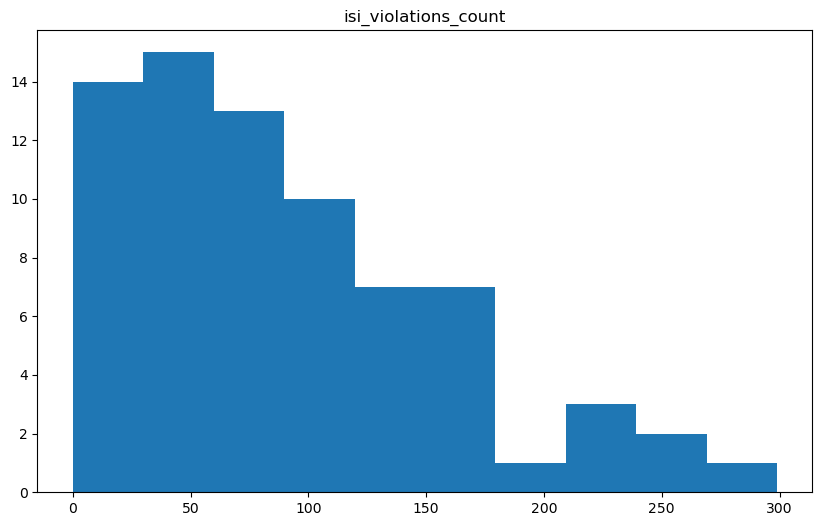

index: 
<built-in method index of isi_violation object at 0x7fc823f50ea0>
index can not be plotted
count: 
<built-in method count of isi_violation object at 0x7fc823f50ea0>
count can not be plotted


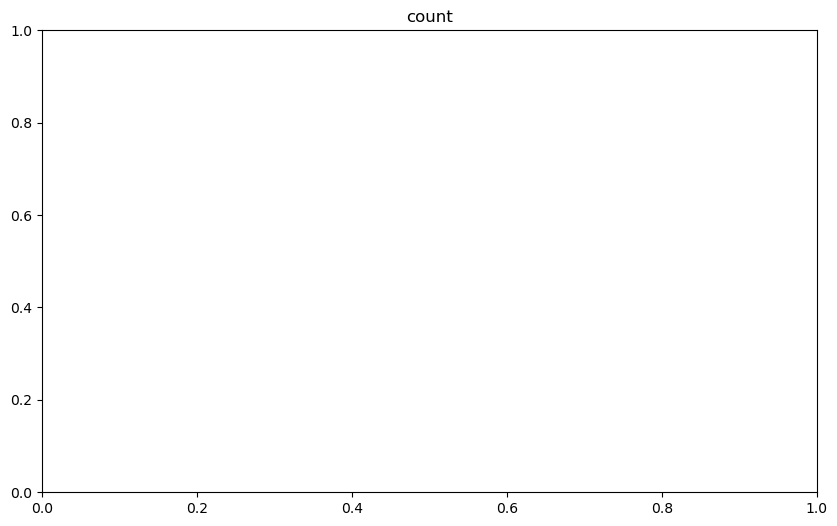

In [74]:
for attribute in isi_violation_tuple.__dir__():
    if "__" not in attribute and not attribute.startswith("_"):
        try:
            print("{}: ".format(attribute))
            print(getattr(isi_violation_tuple, attribute))
            isi_metric = getattr(isi_violation_tuple, attribute)
            plt.title(attribute)
            plt.hist(isi_metric.values())
            plt.show()
        except:
            print("{} can not be plotted".format(attribute))
        

All theses quality metrics can be computed in one shot and returned as
a :code:`pandas.Dataframe`



In [75]:
metrics = spikeinterface.qualitymetrics.compute_quality_metrics(we_spike_sorted)

- Each row is a Unit

In [76]:
metrics

,num_spikes,firing_rate,presence_ratio,snr,isi_violations_ratio,isi_violations_rate,isi_violations_count,amplitude_cutoff,isolation_distance,l_ratio,d_prime
1,627,1.852682,1.0,3.851751,0.0,0.0,0,0.000413,110.307545,50.920972,0.576300
2,2340,6.914314,1.0,5.939439,0.0,0.0,0,0.000129,142.796076,4.506566,5.707965
3,4884,14.431415,1.0,3.815867,0.0,0.0,0,0.000129,135.715925,6.174828,3.018695
4,3725,11.006761,1.0,0.552947,0.0,0.0,0,0.008834,136.164895,6.194187,2.969837
5,4990,14.744628,1.0,3.437188,0.0,0.0,0,0.000129,135.944943,6.143528,3.159681
...,...,...,...,...,...,...,...,...,...,...,...
69,6000,17.729011,1.0,0.486111,0.0,0.0,0,0.000129,123.408493,14.014369,2.377474
70,6306,18.633191,1.0,0.540258,0.0,0.0,0,0.000129,124.322602,13.056813,2.725470
71,7919,23.399340,1.0,3.734336,0.0,0.0,0,0.000129,119.809723,17.071104,2.538243
72,7947,23.482075,1.0,3.782044,0.0,0.0,0,0.008765,120.476178,16.635437,2.411498


Quality metrics can be also used to automatically curate the spike sorting
output. For example, you can select sorted units with a SNR above a
certain threshold:



In [77]:
snr_thresh = 5
isi_viol_thresh = 0.2

In [78]:
our_query = f"snr > {snr_thresh} & isi_violations_rate < {isi_viol_thresh}"
print(our_query)

snr > 5 & isi_violations_rate < 0.2


In [79]:
keep_units = metrics.query(our_query)
keep_unit_ids = keep_units.index.values

In [80]:
sorting_auto = spike_sorted_object.select_units(keep_unit_ids)
print(f"Number of units before curation: {len(spike_sorted_object.get_unit_ids())}")
print(f"Number of units after curation: {len(sorting_auto.get_unit_ids())}")

Number of units before curation: 73
Number of units after curation: 16


# Plotting Channels with Multiple Units

## Compute unit maximum channel¶

- For each unit, calculating the channel with the highest the most extreme signal

In [81]:
extremum_channels_ids = spikeinterface.postprocessing.get_template_extremum_channel(we_spike_sorted, peak_sign='neg')
print(extremum_channels_ids)

{1: '0', 2: '1', 3: '1', 4: '16', 5: '2', 6: '16', 7: '22', 8: '3', 9: '3', 10: '4', 11: '16', 12: '4', 13: '5', 14: '5', 15: '5', 16: '6', 17: '6', 18: '7', 19: '7', 20: '8', 21: '8', 22: '9', 23: '9', 24: '10', 25: '10', 26: '11', 27: '11', 28: '11', 29: '12', 30: '12', 31: '13', 32: '13', 33: '16', 34: '16', 35: '17', 36: '17', 37: '18', 38: '18', 39: '19', 40: '19', 41: '20', 42: '20', 43: '20', 44: '21', 45: '21', 46: '21', 47: '22', 48: '22', 49: '22', 50: '23', 51: '23', 52: '23', 53: '23', 54: '23', 55: '16', 56: '24', 57: '24', 58: '25', 59: '25', 60: '25', 61: '26', 62: '26', 63: '23', 64: '27', 65: '27', 66: '16', 67: '28', 68: '29', 69: '29', 70: '16', 71: '30', 72: '31', 73: '16'}


In [82]:
extremum_channels_ids = spikeinterface.postprocessing.get_template_extremum_channel(we_spike_sorted, peak_sign='pos')
print(extremum_channels_ids)

{1: '0', 2: '1', 3: '1', 4: '1', 5: '16', 6: '2', 7: '1', 8: '3', 9: '3', 10: '4', 11: '4', 12: '4', 13: '5', 14: '5', 15: '5', 16: '6', 17: '6', 18: '7', 19: '7', 20: '8', 21: '8', 22: '9', 23: '9', 24: '10', 25: '10', 26: '11', 27: '11', 28: '11', 29: '12', 30: '12', 31: '13', 32: '13', 33: '16', 34: '16', 35: '17', 36: '17', 37: '18', 38: '18', 39: '19', 40: '19', 41: '20', 42: '20', 43: '20', 44: '21', 45: '21', 46: '11', 47: '22', 48: '22', 49: '3', 50: '23', 51: '23', 52: '19', 53: '23', 54: '23', 55: '24', 56: '24', 57: '24', 58: '24', 59: '25', 60: '25', 61: '26', 62: '26', 63: '19', 64: '27', 65: '27', 66: '28', 67: '16', 68: '29', 69: '29', 70: '30', 71: '16', 72: '31', 73: '31'}


- Getting the channel that's the top channel for multiple units

In [83]:
channel_to_units = defaultdict(dict)
for k, v in extremum_channels_ids.items():
    channel_to_units[v] = channel_to_units.get(v, []) + [k]

In [84]:
channel_to_units

defaultdict(dict,
            {'0': [1],
             '1': [2, 3, 4, 7],
             '16': [5, 33, 34, 67, 71],
             '2': [6],
             '3': [8, 9, 49],
             '4': [10, 11, 12],
             '5': [13, 14, 15],
             '6': [16, 17],
             '7': [18, 19],
             '8': [20, 21],
             '9': [22, 23],
             '10': [24, 25],
             '11': [26, 27, 28, 46],
             '12': [29, 30],
             '13': [31, 32],
             '17': [35, 36],
             '18': [37, 38],
             '19': [39, 40, 52, 63],
             '20': [41, 42, 43],
             '21': [44, 45],
             '22': [47, 48],
             '23': [50, 51, 53, 54],
             '24': [55, 56, 57, 58],
             '25': [59, 60],
             '26': [61, 62],
             '27': [64, 65],
             '28': [66],
             '29': [68, 69],
             '30': [70],
             '31': [72, 73]})

In [85]:
channel_to_multiple_units = {k:v for k, v in channel_to_units.items() if len(v) >=2}

In [86]:
channel_to_multiple_units

{'1': [2, 3, 4, 7],
 '16': [5, 33, 34, 67, 71],
 '3': [8, 9, 49],
 '4': [10, 11, 12],
 '5': [13, 14, 15],
 '6': [16, 17],
 '7': [18, 19],
 '8': [20, 21],
 '9': [22, 23],
 '10': [24, 25],
 '11': [26, 27, 28, 46],
 '12': [29, 30],
 '13': [31, 32],
 '17': [35, 36],
 '18': [37, 38],
 '19': [39, 40, 52, 63],
 '20': [41, 42, 43],
 '21': [44, 45],
 '22': [47, 48],
 '23': [50, 51, 53, 54],
 '24': [55, 56, 57, 58],
 '25': [59, 60],
 '26': [61, 62],
 '27': [64, 65],
 '29': [68, 69],
 '31': [72, 73]}

- PCA Plots

In [87]:
multiple_unit_per_channel_output_directory = os.path.join(waveform_output_directory, "plots", "multiple_unit_per_channel")


In [88]:
multiple_unit_per_channel_output_directory

'/nancy/user/riwata/projects/spike_gadgets_repo/results/2022_09_27_spikegadgets_phy_viewing/20220907_140232test/proc/20220907_140232test/mountainsort4/2022_09_27/waveforms/plots/multiple_unit_per_channel'

In [89]:
os.makedirs(multiple_unit_per_channel_output_directory)


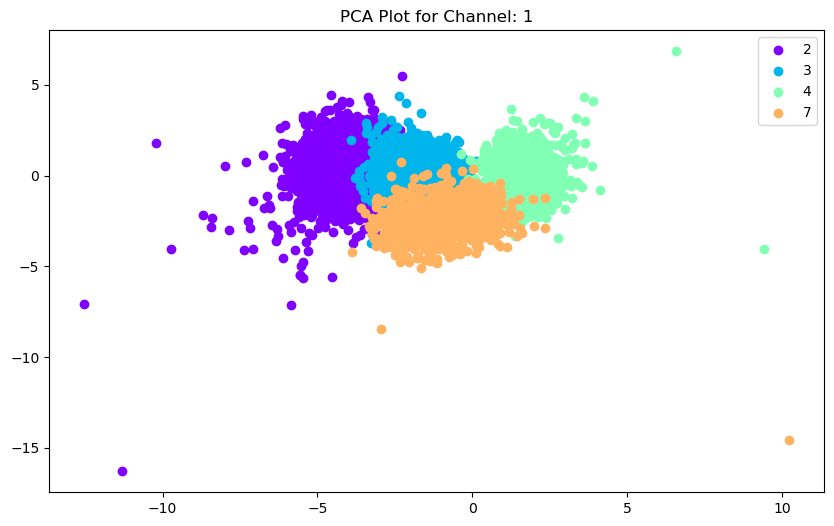

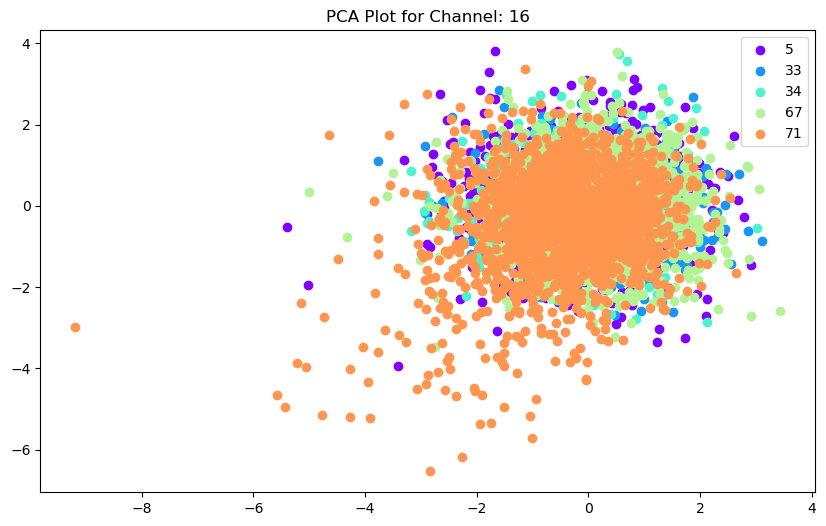

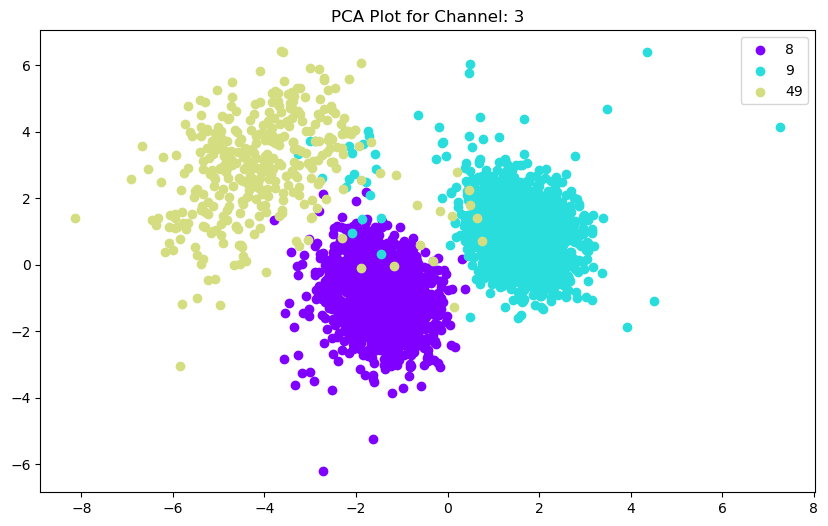

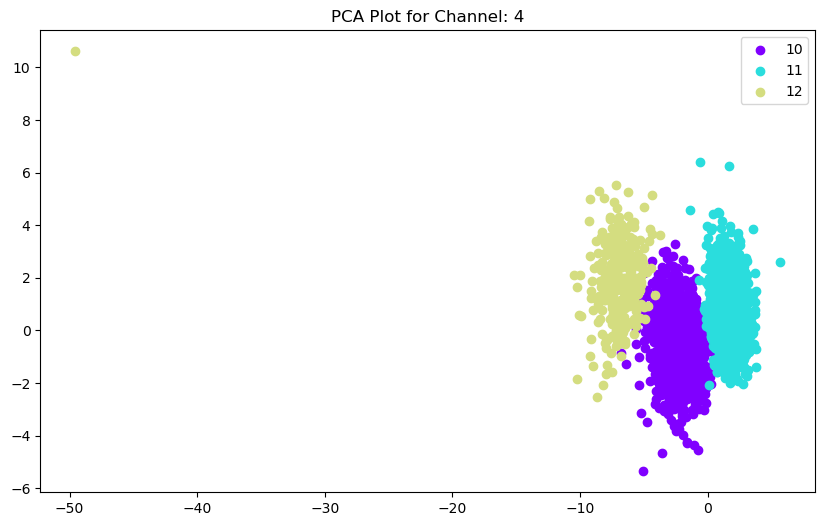

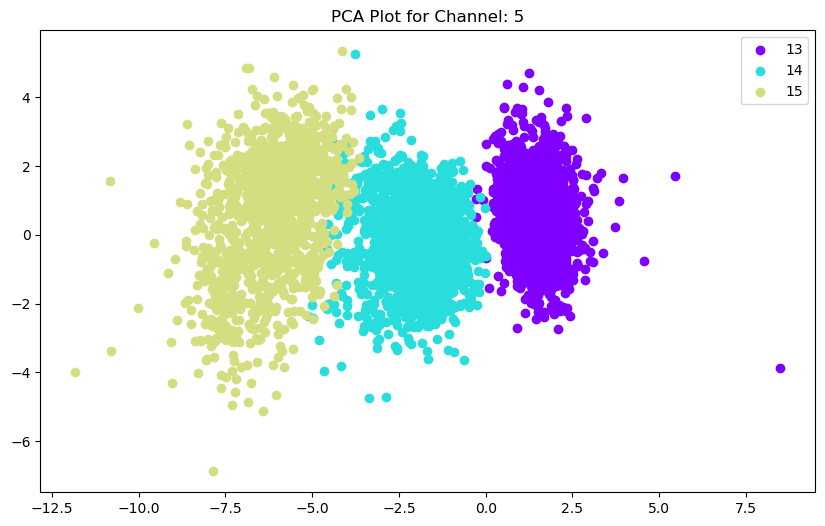

...

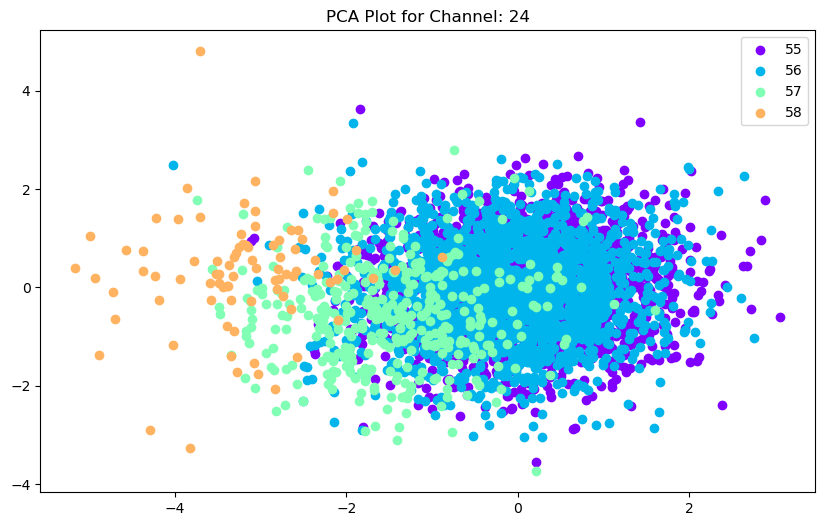

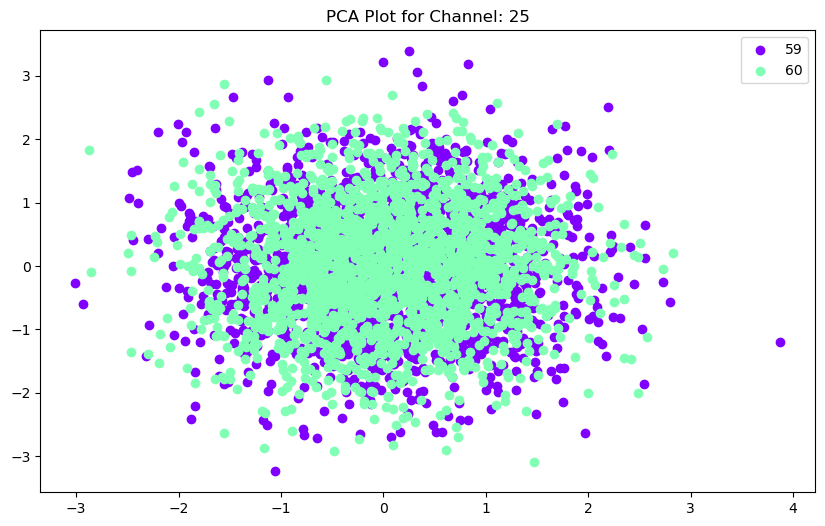

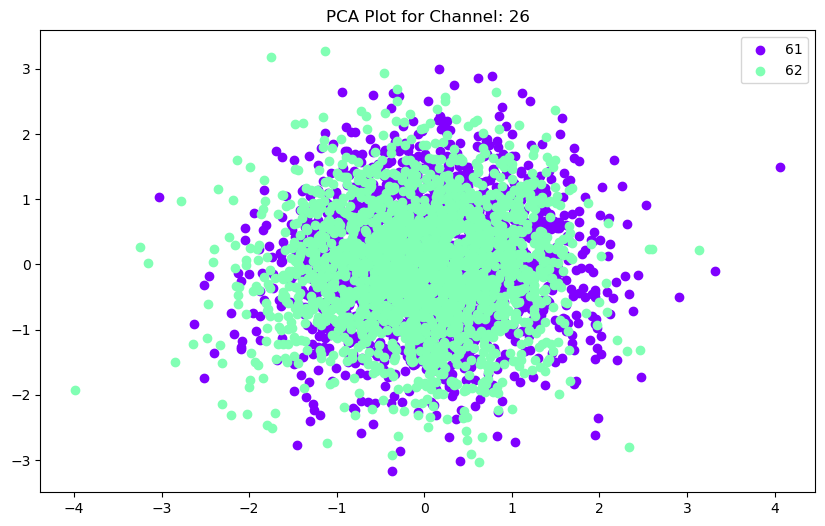

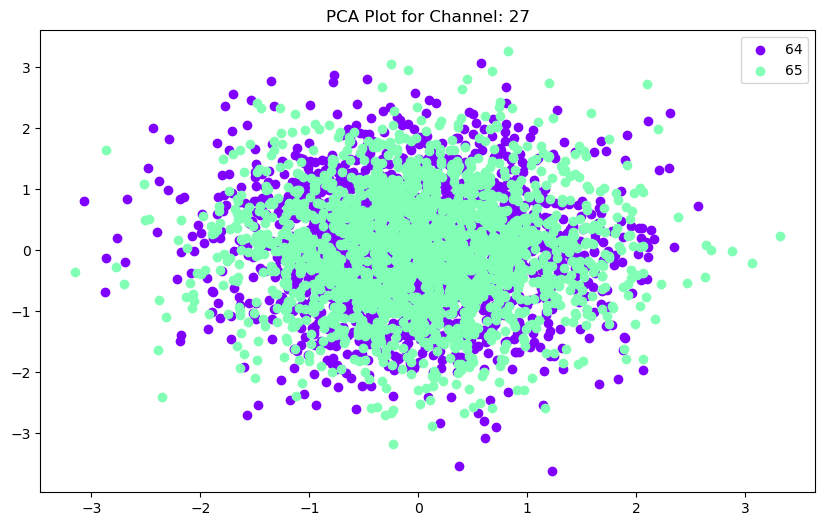

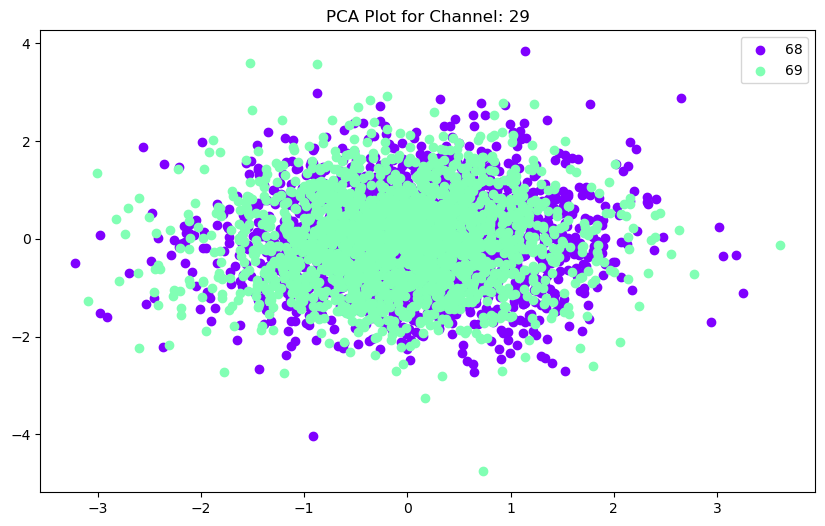

IndexError: index 31 is out of bounds for axis 2 with size 30

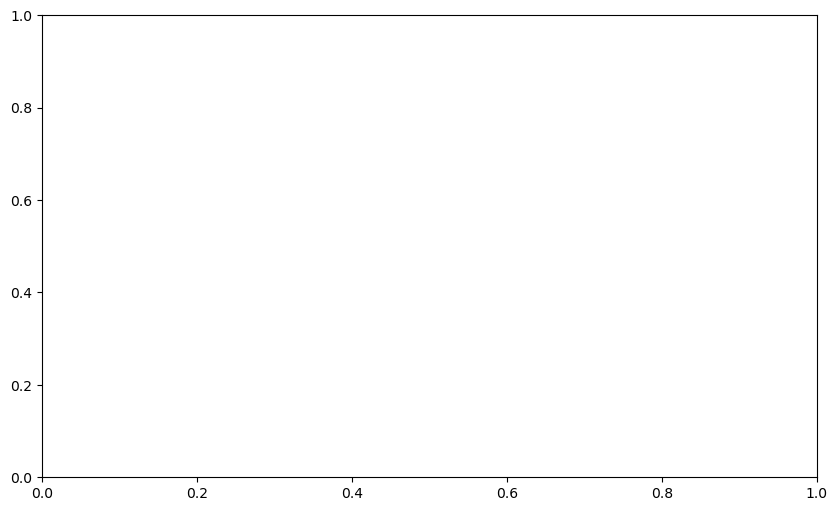

In [90]:
for channel, multiple_units in channel_to_multiple_units.items():

    n = len(multiple_units) + 1
    colors = iter(cm.rainbow(np.linspace(0, 1, n)))

    fig, ax = plt.subplots()
    for i, unit_id in enumerate(multiple_units):
        comp = pc.get_projections(unit_id)
#         print(comp.shape)
        color = next(colors)
        ax.scatter(comp[:, 0, int(channel)], comp[:, 1, int(channel)], color=color, label=unit_id)
    ax.legend()
#     print(channel)
    ax.set_title("PCA Plot for Channel: {}".format(str(channel)))
    plt.savefig(os.path.join(multiple_unit_per_channel_output_directory, "multiple_unit_per_channel_channel_{}".format(channel_id)))
    plt.show()
    plt.close()

# Supplementary Visualization and Quality Metrics

In [ ]:
raise ValueError("Cells below are other options for visualizations and quality metrics. They take time and are still being tested, so running the rest of the notebook is not necessary. They are for those that want to look further into the recording data and the the postprocessing steps.")

# Looking over the waveforms for the different unit groups

In [ ]:
for channel, multiple_units in channel_to_multiple_units.items():
    print("Channel: {}".format(channel))
    for unit in multiple_units:
        print("Unit: {}".format(unit))
        sw.plot_unit_templates(we_spike_sorted, channel_ids=recording_preprocessed.channel_ids, unit_ids=[unit], plot_templates=True, plot_channels=True)
        plt.show()
        plt.close()

In [ ]:
for channel, multiple_units in channel_to_multiple_units.items():
    print("Channel: {}".format(channel))
    for unit in multiple_units:
        print("Unit: {}".format(unit))
        w = sw.plot_unit_summary(we_spike_sorted, unit_id=unit)
        plt.show()
        plt.close()

## Spike Amplitudes

- Spike amplitudes can be computed with the `get_spike_amplitudes` function.


In [ ]:
amplitudes = st.get_spike_amplitudes(we_spike_sorted, outputs="concatenated", progress_bar=True)

In [ ]:
amplitudes[0].shape

In [ ]:
sw.plot_amplitudes_distribution(we_spike_sorted, unit_ids=high_snr_units)

In [ ]:
sw.plot_amplitudes_timeseries(we_spike_sorted, unit_ids=high_snr_units[:1])

By default, all amplitudes are concatenated in one array.

The correspinding spike times and labels can be easily retrieved as:

In [ ]:
all_spike_times, all_spike_labels = spike_sorted_object.get_all_spike_trains()[0]


- The [0] index is to select the first segment. In case of multiple segments each element will correspond to a different segment and will contain spike times and labels for that segment.


## ISI Violations

- https://github.com/SpikeInterface/spikeinterface/blob/master/spikeinterface/toolkit/qualitymetrics/misc_metrics.py
- https://numpy.org/doc/stable/reference/generated/numpy.diff.html

- The code that's used for the ISI Calcuations which suggest that only the differences between neighbors are being calculated

In [ ]:

# all units converted to seconds
for unit_id in unit_ids:
    num_violations = 0
    num_spikes = 0
    for segment_index in range(num_segs):
        spike_train = sorting.get_unit_spike_train(unit_id=unit_id, segment_index=segment_index)
        isis = np.diff(spike_train)
        num_spikes += len(spike_train)
        num_violations += np.sum(isis < isi_threshold_samples)
    violation_time = 2 * num_spikes * (isi_threshold_s - min_isi_s)

- TODO: Install pyarrow

In [ ]:
spike_sorted_quality_metrics_df

## Filtering based on metrics

- Focusing on:
    - snr, isi_violations_rate, isolation_distance

In [ ]:
good_units = spike_sorted_quality_metrics_df[(spike_sorted_quality_metrics_df["snr"] >= 4) & (spike_sorted_quality_metrics_df["isi_violations_rate"] < 0.01)]

In [ ]:
adequate_units = spike_sorted_quality_metrics_df[(spike_sorted_quality_metrics_df["snr"] >= 4) & (spike_sorted_quality_metrics_df["isi_violations_rate"] < 0.05) & (spike_sorted_quality_metrics_df["isi_violations_rate"] > 0.01)]

In [ ]:
good_units

In [ ]:
adequate_units

- Looking over the unit summaries of units that match our criteria

In [ ]:
for index, unit in good_units.iterrows():
    w = sw.plot_unit_summary(we_spike_sorted, unit_id=index)

## 3D Plots for PCA

In [ ]:
from mpl_toolkits import mplot3d

In [ ]:
fig = plt.figure()
ax = plt.axes(projection='3d')
ax = plt.axes(projection='3d')

In [ ]:
for channel, multiple_units in channel_to_multiple_units.items():

    n = len(multiple_units) + 1
    colors = iter(cm.rainbow(np.linspace(0, 1, n)))

    fig = plt.figure()
    ax = plt.axes(projection='3d')
    for i, unit_id in enumerate(multiple_units):
        comp = pc.get_components(unit_id)
#         print(comp.shape)
        color = next(colors)
#         ax.scatter(comp[:, 0, 8], comp[:, 1, 8], color=color, label=unit_id)
        ax.scatter3D(comp[:, 0, int(channel)], comp[:, 1, int(channel)], comp[:, 2, int(channel)], c=color, cmap='Greens', label=unit_id);
        
    # make simple, bare axis lines through space:
    xAxisLine = ((min(comp[:, 0, int(channel)]), max(comp[:, 0, int(channel)])), (0, 0), (0,0))
    ax.plot(xAxisLine[0], xAxisLine[1], xAxisLine[2], 'r')
    yAxisLine = ((0, 0), (min(comp[:, 1, int(channel)]), max(comp[:, 1, int(channel)])), (0,0))
    ax.plot(yAxisLine[0], yAxisLine[1], yAxisLine[2], 'r')
    zAxisLine = ((0, 0), (0,0), (min(comp[:, 2, int(channel)]), max(comp[:, 2, int(channel)])))
    ax.plot(zAxisLine[0], zAxisLine[1], zAxisLine[2], 'r')

    # label the axes
    ax.set_xlabel("PC1")
    ax.set_ylabel("PC2")
    ax.set_zlabel("PC3")
    
    ax.legend()
#     print(channel)
    ax.set_title("PCA Plot for Channel: {}".format(str(channel)))
    plt.show()
    plt.close()

raise ValueError("Other things being worked on")

# Things being worked on

In [ ]:
we_spike_sorted.

In [ ]:
spike_sorting_dict = spike_sorted_object.to_dict()

In [ ]:
spike_sorting_dict

In [ ]:
spike_sorting_array = np.load(spike_sorting_dict["kwargs"]["file_path"])

In [ ]:
spike_sorting_array["unit_ids"]

In [ ]:
spike_sorting_array["sampling_frequency"]

In [ ]:
spike_sorted_object.frame_slice(start_frame=0, end_frame=10)

In [ ]:
spike_sorted_object

In [ ]:
spike_sorted_object.ids_to_indices(ids=[1,2])

In [ ]:
spike_sorted_object.get_unit_spike_train(unit_id=1)

In [ ]:
spike_sorted_object

In [ ]:
for index in spike_sorting_array:
    print(index)

In [ ]:
spike_sorting_array["unit_ids"]

In [ ]:
spike_sorting_array["num_segment"]

In [ ]:
spike_indexes = spike_sorting_array["spike_indexes_seg0"]

In [ ]:
spike_indexes

In [ ]:
spike_indexes.shape

- Spike Indexes

In [ ]:
6768561/20000

- Voltage Timestamp Array

In [ ]:
(45873339-39104773)/20000

- Comparison between spike and voltage timestamps

In [ ]:
(45873339-39104773)-6768561

In [ ]:
spike_labels = spike_sorting_array["spike_labels_seg0"]

In [ ]:
spike_labels

In [ ]:
spike_labels.shape

In [ ]:
spike_sorting_array["sampling_frequency"]